# **Importing necessary libraries**

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import statsmodels.api as sm
from scipy.stats import f
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

#Oversampling technique
from imblearn.over_sampling import SMOTE

from sklearn.model_selection import StratifiedKFold

from sklearn.metrics import accuracy_score, precision_recall_fscore_support, confusion_matrix
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score, make_scorer
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

import xgboost as xgb

import warnings

# Ignore all runtime warnings
warnings.filterwarnings("ignore")

In [2]:
data=pd.read_csv('fetal_health.csv')
data.head()

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
0,120.0,0.000,0.0,0.000,0.000,0.0,0.0,73.0,0.5,43.0,...,62.0,126.0,2.0,0.0,120.0,137.0,121.0,73.0,1.0,2.0
1,132.0,0.006,0.0,0.006,0.003,0.0,0.0,17.0,2.1,0.0,...,68.0,198.0,6.0,1.0,141.0,136.0,140.0,12.0,0.0,1.0
2,133.0,0.003,0.0,0.008,0.003,0.0,0.0,16.0,2.1,0.0,...,68.0,198.0,5.0,1.0,141.0,135.0,138.0,13.0,0.0,1.0
3,134.0,0.003,0.0,0.008,0.003,0.0,0.0,16.0,2.4,0.0,...,53.0,170.0,11.0,0.0,137.0,134.0,137.0,13.0,1.0,1.0
4,132.0,0.007,0.0,0.008,0.000,0.0,0.0,16.0,2.4,0.0,...,53.0,170.0,9.0,0.0,137.0,136.0,138.0,11.0,1.0,1.0


In [3]:
data.shape

(2126, 22)

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2126 entries, 0 to 2125
Data columns (total 22 columns):
 #   Column                                                  Non-Null Count  Dtype  
---  ------                                                  --------------  -----  
 0   baseline value                                          2126 non-null   float64
 1   accelerations                                           2126 non-null   float64
 2   fetal_movement                                          2126 non-null   float64
 3   uterine_contractions                                    2126 non-null   float64
 4   light_decelerations                                     2126 non-null   float64
 5   severe_decelerations                                    2126 non-null   float64
 6   prolongued_decelerations                                2126 non-null   float64
 7   abnormal_short_term_variability                         2126 non-null   float64
 8   mean_value_of_short_term_variability  

In [5]:
data.describe()

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
count,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.00000,...,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000,2126.000000
mean,133.303857,0.003178,0.009481,0.004366,0.001889,0.000003,0.000159,46.990122,1.332785,9.84666,...,93.579492,164.025400,4.068203,0.323612,137.452023,134.610536,138.090310,18.808090,0.320320,1.304327
std,9.840844,0.003866,0.046666,0.002946,0.002960,0.000057,0.000590,17.192814,0.883241,18.39688,...,29.560212,17.944183,2.949386,0.706059,16.381289,15.593596,14.466589,28.977636,0.610829,0.614377
min,106.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12.000000,0.200000,0.00000,...,50.000000,122.000000,0.000000,0.000000,60.000000,73.000000,77.000000,0.000000,-1.000000,1.000000
25%,126.000000,0.000000,0.000000,0.002000,0.000000,0.000000,0.000000,32.000000,0.700000,0.00000,...,67.000000,152.000000,2.000000,0.000000,129.000000,125.000000,129.000000,2.000000,0.000000,1.000000
50%,133.000000,0.002000,0.000000,0.004000,0.000000,0.000000,0.000000,49.000000,1.200000,0.00000,...,93.000000,162.000000,3.000000,0.000000,139.000000,136.000000,139.000000,7.000000,0.000000,1.000000
75%,140.000000,0.006000,0.003000,0.007000,0.003000,0.000000,0.000000,61.000000,1.700000,11.00000,...,120.000000,174.000000,6.000000,0.000000,148.000000,145.000000,148.000000,24.000000,1.000000,1.000000
max,160.000000,0.019000,0.481000,0.015000,0.015000,0.001000,0.005000,87.000000,7.000000,91.00000,...,159.000000,238.000000,18.000000,10.000000,187.000000,182.000000,186.000000,269.000000,1.000000,3.000000


In [6]:
data.isnull().sum()

baseline value                                            0
accelerations                                             0
fetal_movement                                            0
uterine_contractions                                      0
light_decelerations                                       0
severe_decelerations                                      0
prolongued_decelerations                                  0
abnormal_short_term_variability                           0
mean_value_of_short_term_variability                      0
percentage_of_time_with_abnormal_long_term_variability    0
mean_value_of_long_term_variability                       0
histogram_width                                           0
histogram_min                                             0
histogram_max                                             0
histogram_number_of_peaks                                 0
histogram_number_of_zeroes                                0
histogram_mode                          

In [7]:
data.columns

Index(['baseline value', 'accelerations', 'fetal_movement',
       'uterine_contractions', 'light_decelerations', 'severe_decelerations',
       'prolongued_decelerations', 'abnormal_short_term_variability',
       'mean_value_of_short_term_variability',
       'percentage_of_time_with_abnormal_long_term_variability',
       'mean_value_of_long_term_variability', 'histogram_width',
       'histogram_min', 'histogram_max', 'histogram_number_of_peaks',
       'histogram_number_of_zeroes', 'histogram_mode', 'histogram_mean',
       'histogram_median', 'histogram_variance', 'histogram_tendency',
       'fetal_health'],
      dtype='object')

In [8]:
features=list(data.drop(columns=['fetal_health']).columns)
features

['baseline value',
 'accelerations',
 'fetal_movement',
 'uterine_contractions',
 'light_decelerations',
 'severe_decelerations',
 'prolongued_decelerations',
 'abnormal_short_term_variability',
 'mean_value_of_short_term_variability',
 'percentage_of_time_with_abnormal_long_term_variability',
 'mean_value_of_long_term_variability',
 'histogram_width',
 'histogram_min',
 'histogram_max',
 'histogram_number_of_peaks',
 'histogram_number_of_zeroes',
 'histogram_mode',
 'histogram_mean',
 'histogram_median',
 'histogram_variance',
 'histogram_tendency']

## **Basic EDA**

In [9]:
data['fetal_health'].value_counts()

fetal_health
1.0    1655
2.0     295
3.0     176
Name: count, dtype: int64

In [10]:
X=data[features]
y=data['fetal_health']

In [11]:
X

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_width,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency
0,120.0,0.000,0.000,0.000,0.000,0.0,0.0,73.0,0.5,43.0,...,64.0,62.0,126.0,2.0,0.0,120.0,137.0,121.0,73.0,1.0
1,132.0,0.006,0.000,0.006,0.003,0.0,0.0,17.0,2.1,0.0,...,130.0,68.0,198.0,6.0,1.0,141.0,136.0,140.0,12.0,0.0
2,133.0,0.003,0.000,0.008,0.003,0.0,0.0,16.0,2.1,0.0,...,130.0,68.0,198.0,5.0,1.0,141.0,135.0,138.0,13.0,0.0
3,134.0,0.003,0.000,0.008,0.003,0.0,0.0,16.0,2.4,0.0,...,117.0,53.0,170.0,11.0,0.0,137.0,134.0,137.0,13.0,1.0
4,132.0,0.007,0.000,0.008,0.000,0.0,0.0,16.0,2.4,0.0,...,117.0,53.0,170.0,9.0,0.0,137.0,136.0,138.0,11.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2121,140.0,0.000,0.000,0.007,0.000,0.0,0.0,79.0,0.2,25.0,...,40.0,137.0,177.0,4.0,0.0,153.0,150.0,152.0,2.0,0.0
2122,140.0,0.001,0.000,0.007,0.000,0.0,0.0,78.0,0.4,22.0,...,66.0,103.0,169.0,6.0,0.0,152.0,148.0,151.0,3.0,1.0
2123,140.0,0.001,0.000,0.007,0.000,0.0,0.0,79.0,0.4,20.0,...,67.0,103.0,170.0,5.0,0.0,153.0,148.0,152.0,4.0,1.0
2124,140.0,0.001,0.000,0.006,0.000,0.0,0.0,78.0,0.4,27.0,...,66.0,103.0,169.0,6.0,0.0,152.0,147.0,151.0,4.0,1.0


In [12]:
y

0       2.0
1       1.0
2       1.0
3       1.0
4       1.0
       ... 
2121    2.0
2122    2.0
2123    2.0
2124    2.0
2125    1.0
Name: fetal_health, Length: 2126, dtype: float64

### **Correlation and Multicollinearity**

**Correlation Plot**

<Axes: >

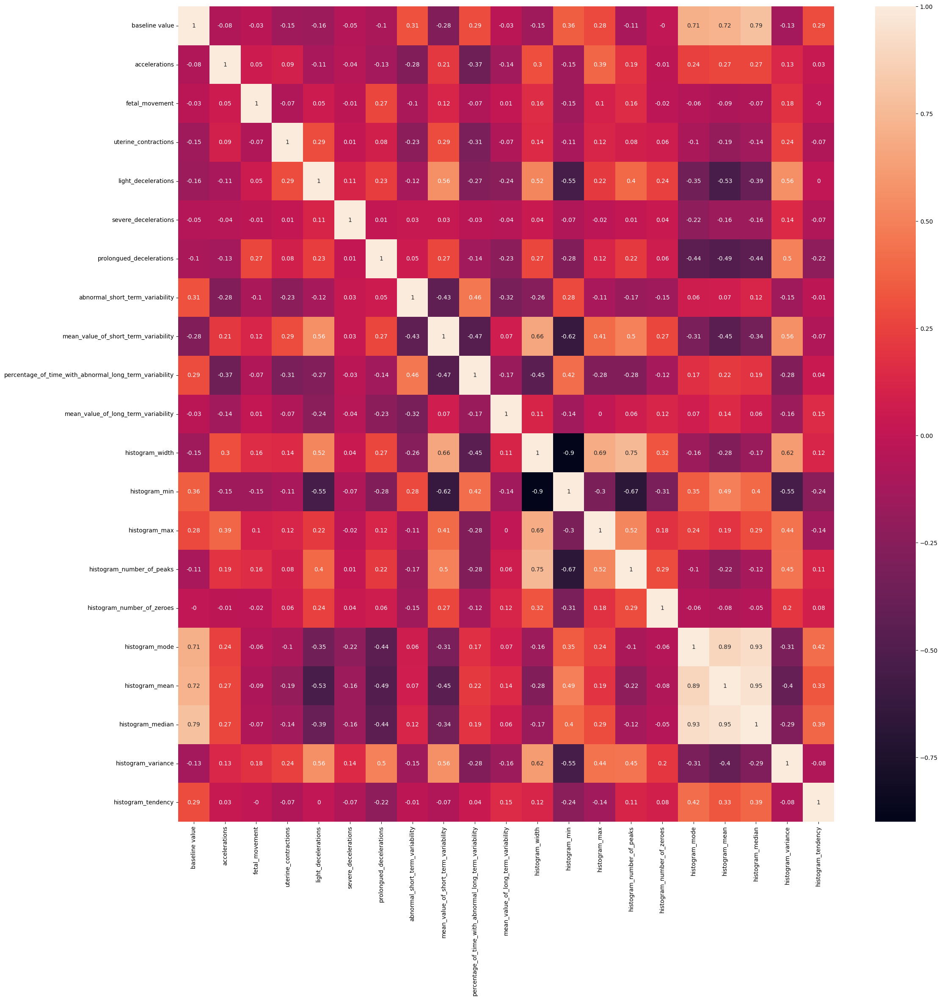

In [13]:
correlation_matrix=X.corr().round(2)
plt.figure(figsize=(25,25))
sns.heatmap(correlation_matrix, annot=True)

 **Multicollinearity test using variance inflation factor(VIF)**

In [14]:
vif_data = pd.DataFrame()
temp=X[features]
vif_data["feature"] = temp.columns

# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(temp.values, i)
                          for i in range(len(temp.columns))]

print(vif_data)

                                              feature          VIF
0                                      baseline value  1058.823853
1                                       accelerations     4.801485
2                                      fetal_movement     1.184827
3                                uterine_contractions     4.034365
4                                 light_decelerations     4.799432
5                                severe_decelerations     1.136294
6                            prolongued_decelerations     2.926905
7                     abnormal_short_term_variability    16.051631
8                mean_value_of_short_term_variability     9.457023
9   percentage_of_time_with_abnormal_long_term_var...     2.417343
10                mean_value_of_long_term_variability     6.309741
11                                    histogram_width          inf
12                                      histogram_min          inf
13                                      histogram_max         

VIF values less than 5 typically indicate low multicollinearity, and values below 10 are generally considered acceptable. Looking at your VIF values:

Features with VIF greater than 10:


*   Baseline value


*   Abnormal short term variability

*   Mean value of short term variability
*   Histogram mode


*   Histogram mean


*   Histogram median





## Removing the highly Correlated Columns

In [15]:
features=list(data.drop(columns=['fetal_health', 'baseline value', 'histogram_width', 'histogram_min', 'histogram_max', 'histogram_median','histogram_mode']).columns)
X=data[features]
y=data['fetal_health']

<Axes: >

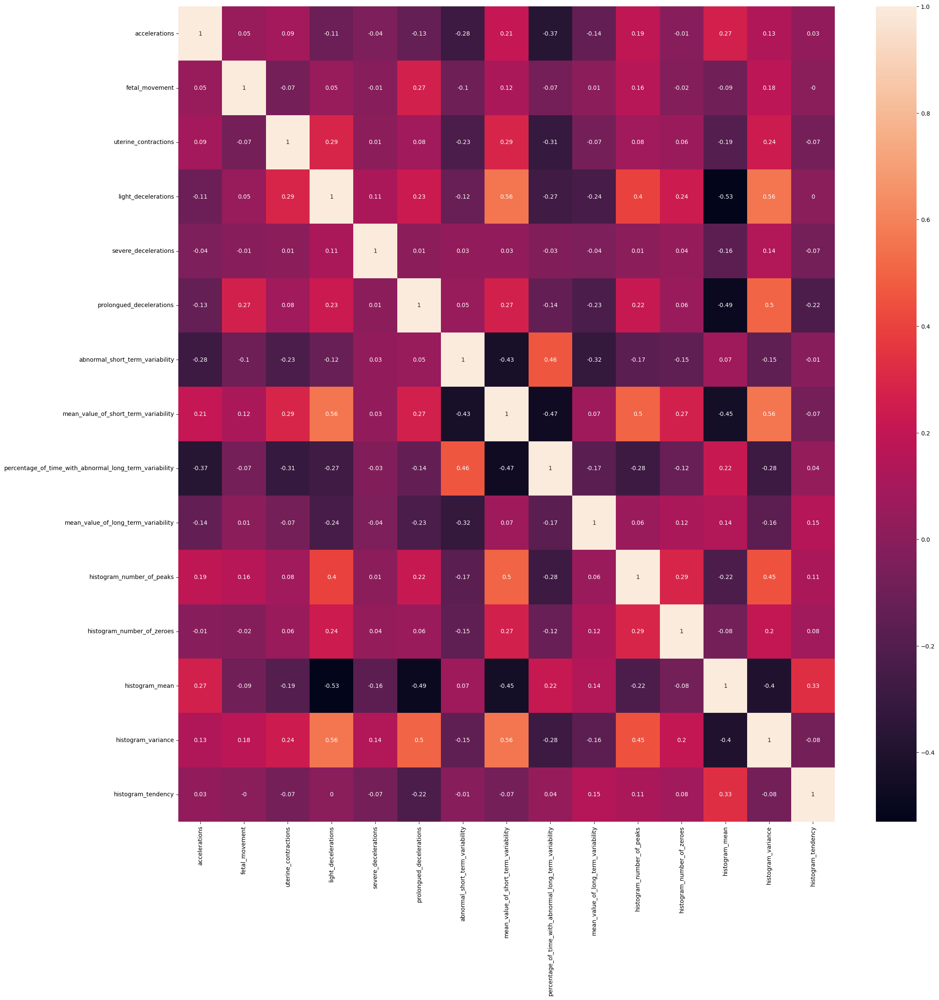

In [16]:
correlation_matrix=X.corr().round(2)
plt.figure(figsize=(25,25))
sns.heatmap(correlation_matrix, annot=True)

In [17]:
vif_data = pd.DataFrame()
temp=X[features]
vif_data["feature"] = temp.columns

# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(temp.values, i)
                          for i in range(len(temp.columns))]

print(vif_data)

                                              feature        VIF
0                                       accelerations   3.460885
1                                      fetal_movement   1.181874
2                                uterine_contractions   3.836236
3                                 light_decelerations   3.563483
4                                severe_decelerations   1.050582
5                            prolongued_decelerations   1.911872
6                     abnormal_short_term_variability  12.550871
7                mean_value_of_short_term_variability   7.691667
8   percentage_of_time_with_abnormal_long_term_var...   2.364395
9                 mean_value_of_long_term_variability   5.462454
10                          histogram_number_of_peaks   4.726706
11                         histogram_number_of_zeroes   1.407436
12                                     histogram_mean  30.609040
13                                 histogram_variance   3.268230
14                       

## **Univariate Analysis**

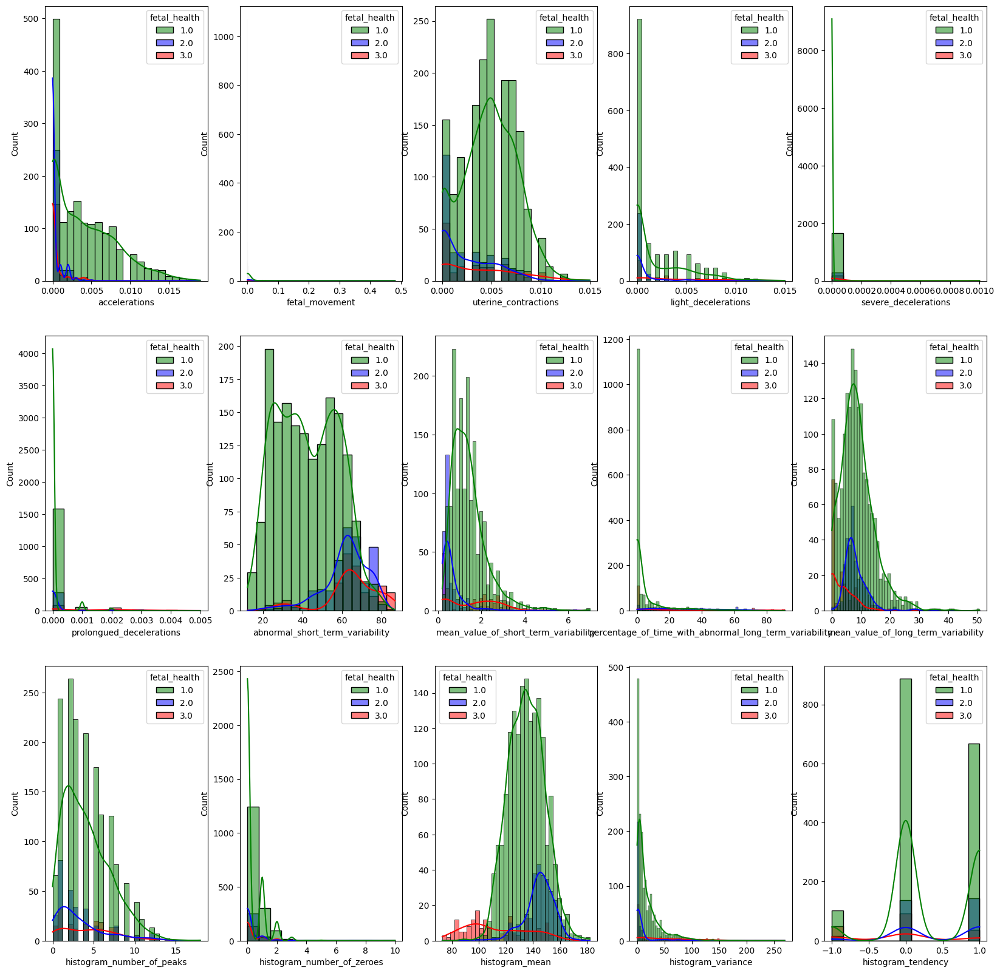

In [18]:
l=len(features)
plt.figure(figsize=(20,20))
for i in range(l):
  plt.subplot(l//4,5,i+1)
  sns.histplot(data=data,x=features[i],kde=True,hue='fetal_health',palette={1:'green',2:'blue',3:'red'})

## **Bivariate Analysis**

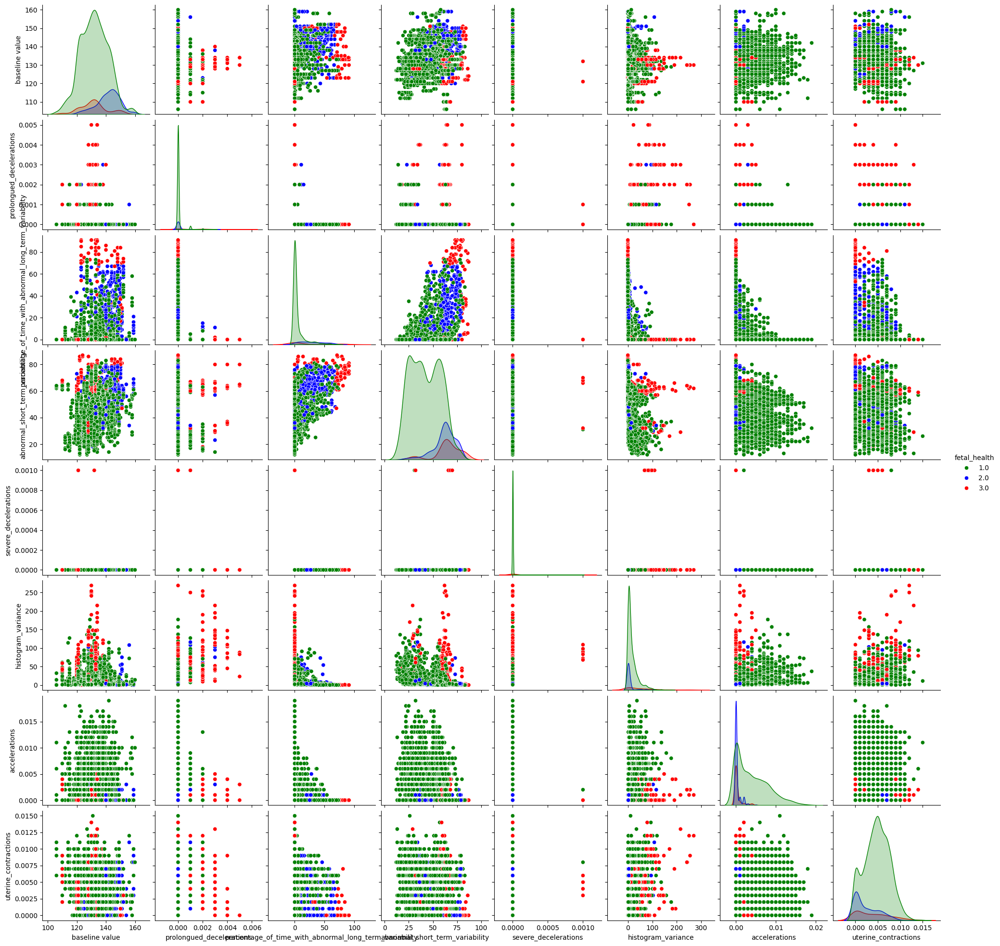

In [19]:
sns.pairplot(data=data[['baseline value','prolongued_decelerations','percentage_of_time_with_abnormal_long_term_variability','abnormal_short_term_variability','severe_decelerations','histogram_variance','accelerations','uterine_contractions','fetal_health']],hue='fetal_health',palette={1:'green',2:'blue',3:'red'})

## **Feature Scaling**

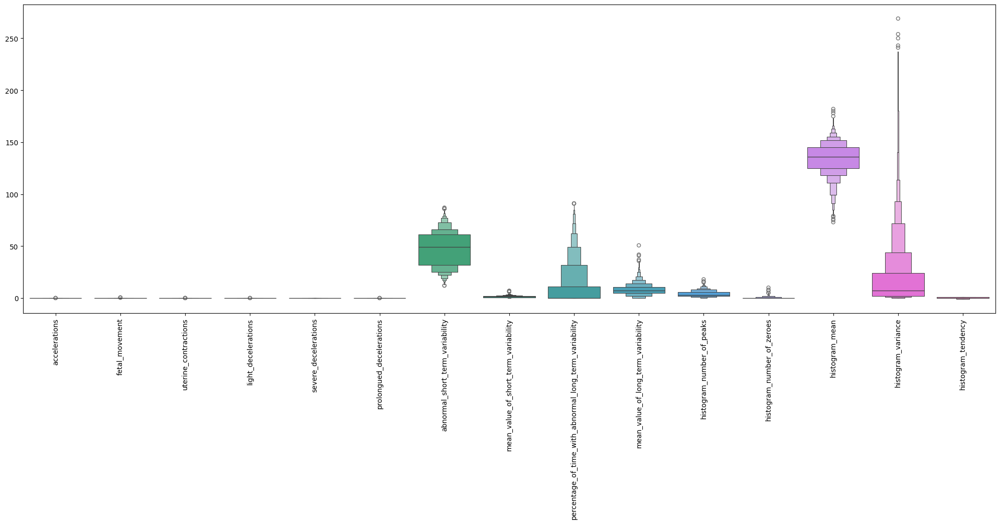

In [20]:
plt.figure(figsize=(25,8))
sns.boxenplot(data=X)
plt.xticks(rotation=90)
plt.show()

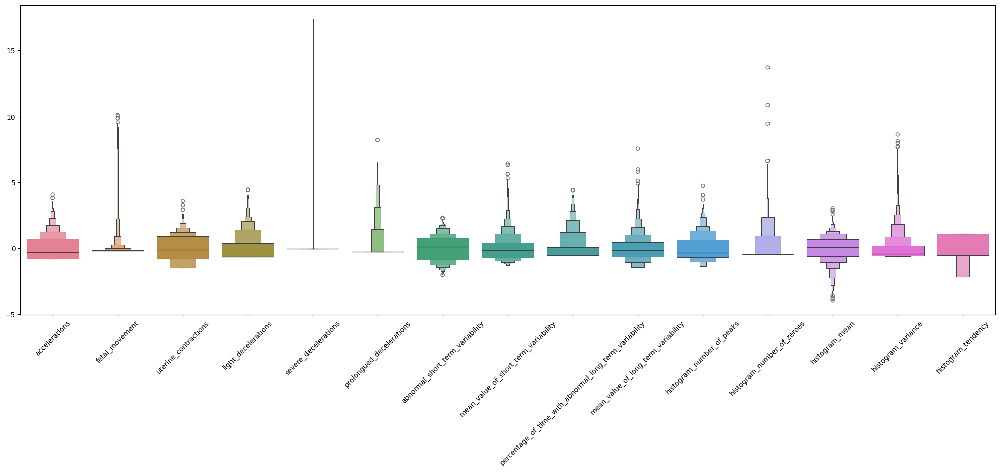

In [21]:
sc=StandardScaler().fit_transform(X)
X_scaled=pd.DataFrame(sc,columns=list(X.columns))

plt.figure(figsize=(25,8))
sns.boxenplot(data=X_scaled)
plt.xticks(rotation=45)
plt.show()

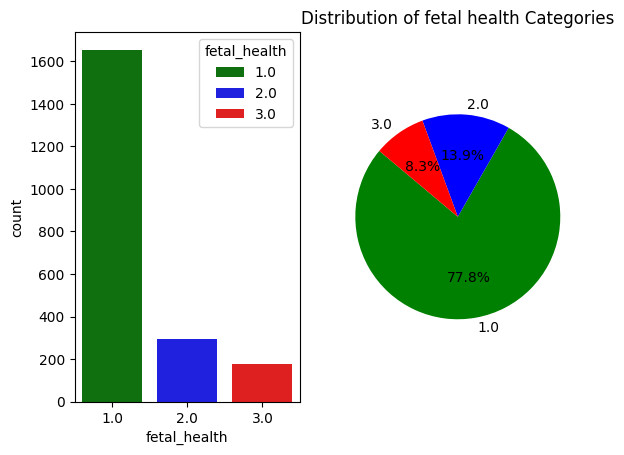

In [22]:
plt.subplot(1,2,1)
sns.countplot(data=data,x='fetal_health',hue='fetal_health',palette={1:'green',2:'blue',3:'red'})

target_counts = data['fetal_health'].value_counts()

# Create pie chart
plt.subplot(1,2,2)
plt.pie(target_counts, labels=target_counts.index, autopct='%1.1f%%', startangle=140,colors=[ 'green', 'blue', 'red'] )
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.title('Distribution of fetal health Categories')
plt.show()

## Oversampling - SMOTE

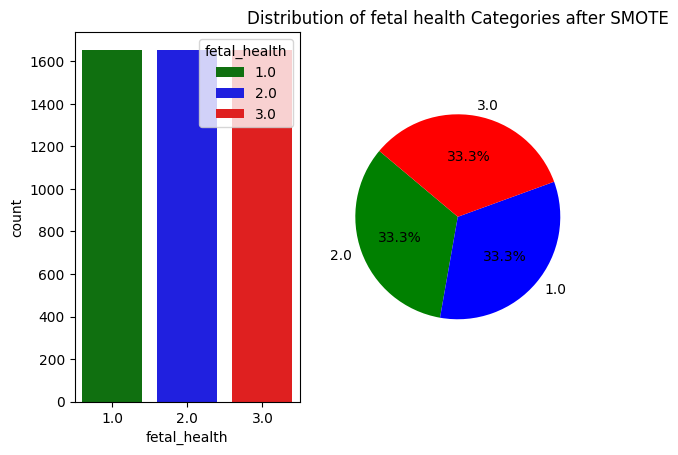

In [23]:
# Initialize SMOTE
smote = SMOTE()

# Apply SMOTE only on training data
X_smote, y_smote = smote.fit_resample(X, y)
target_counts = y_smote.value_counts()

plt.subplot(1,2,1)
sns.countplot(x=y_smote,hue=y_smote,palette={1:'green',2:'blue',3:'red'})
plt.subplot(1,2,2)
# Create pie chart
plt.pie(target_counts, labels=target_counts.index, autopct='%1.1f%%', startangle=140,colors=[ 'green', 'blue', 'red'] )
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.title('Distribution of fetal health Categories after SMOTE')
plt.show()

In [24]:
models=[]
model_precision = {1: [], 2: [], 3: []}
model_recall = {1: [], 2: [], 3: []}
model_f1_score = {1: [], 2: [], 3: []}

train_models=[]
train_model_precision = {1: [], 2: [], 3: []}
train_model_recall = {1: [], 2: [], 3: []}
train_model_f1_score = {1: [], 2: [], 3: []}

## Logistic Regression

In [25]:
# Assuming you have your features in X and labels in y as numpy arrays

# Define the number of splits for cross-validation
n_splits = 5
# Initialize Stratified KFold
skf = StratifiedKFold(n_splits=n_splits, shuffle = True, random_state=42)


# Initialize SMOTE
smote = SMOTE()

# Initialize StandardScaler
scaler = StandardScaler()

X_ = X.values
y_np = y.values
y_ = y_np.astype(int)

# Initialize lists to store metrics
accuracies = []
precisions = {1: [], 2: [], 3: []}
recalls = {1: [], 2: [], 3: []}
f1_scores = {1: [], 2: [], 3: []}

train_accuracies = []
train_precisions = {1: [], 2: [], 3: []}
train_recalls = {1: [], 2: [], 3: []}
train_f1_scores = {1: [], 2: [], 3: []}

# Perform cross-validation
for train_index, test_index in skf.split(X_, y_):
    X_train, X_test = X_[train_index], X_[test_index]
    y_train, y_test = y_[train_index], y_[test_index]

    # Apply StandardScaler
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Apply SMOTE only on training data
    X_train_resampled, y_train_resampled = smote.fit_resample(X_train_scaled, y_train)

    log_reg = LogisticRegression(max_iter=1000)

# Train your classifier
    log_reg.fit(X_train_resampled, y_train_resampled)

    y_pred = log_reg.predict(X_test_scaled)
    y_pred_train = log_reg.predict(X_train_resampled)

    # Calculate accuracy
    accuracy = accuracy_score(y_test, y_pred)
    accuracy_train = accuracy_score(y_train_resampled, y_pred_train)
    accuracies.append(accuracy)
    train_accuracies.append(accuracy_train)

    # Calculate precision, recall, and F1 score for each class
    precision, recall, f1_score, _ = precision_recall_fscore_support(y_test, y_pred, labels=[1, 2, 3])
    for i in range(1, 4):
        precisions[i].append(precision[i-1])
        recalls[i].append(recall[i-1])
        f1_scores[i].append(f1_score[i-1])

    # Calculate precision, recall, and F1 score for each class
    precision, recall, f1_score, _ = precision_recall_fscore_support(y_train_resampled, y_pred_train, labels=[1, 2, 3])
    for i in range(1, 4):
        train_precisions[i].append(precision[i-1])
        train_recalls[i].append(recall[i-1])
        train_f1_scores[i].append(f1_score[i-1])


# Calculate and print the average metrics for each class
avg_accuracy = np.mean(accuracies)
train_avg_accuracy = np.mean(train_accuracies)
print("Average Accuracy:", avg_accuracy)
models.append('Logistic Regression')
train_models.append('Logistic Regression')
for i in range(1, 4):
    avg_precision = np.mean(precisions[i])
    avg_recall = np.mean(recalls[i])
    avg_f1_score = np.mean(f1_scores[i])

    train_avg_precision = np.mean(train_precisions[i])
    train_avg_recall = np.mean(train_recalls[i])
    train_avg_f1_score = np.mean(train_f1_scores[i])

    print(f"\nMetrics for Class {i}:")
    print("Average Precision:", avg_precision)
    print("Average Recall:", avg_recall)
    print("Average F1 Score:", avg_f1_score)
    model_precision[i].append(avg_precision)
    model_recall[i].append(avg_recall)
    model_f1_score[i].append(avg_f1_score)
    train_model_precision[i].append(train_avg_precision)
    train_model_recall[i].append(train_avg_recall)
    train_model_f1_score[i].append(train_avg_f1_score)

Average Accuracy: 0.8640684893675781

Metrics for Class 1:
Average Precision: 0.9838572783953209
Average Recall: 0.8761329305135952
Average F1 Score: 0.9267303947079256

Metrics for Class 2:
Average Precision: 0.5615652193423176
Average Recall: 0.8169491525423729
Average F1 Score: 0.6644929526327903

Metrics for Class 3:
Average Precision: 0.6709429400386847
Average Recall: 0.8298412698412699
Average F1 Score: 0.737076225413872


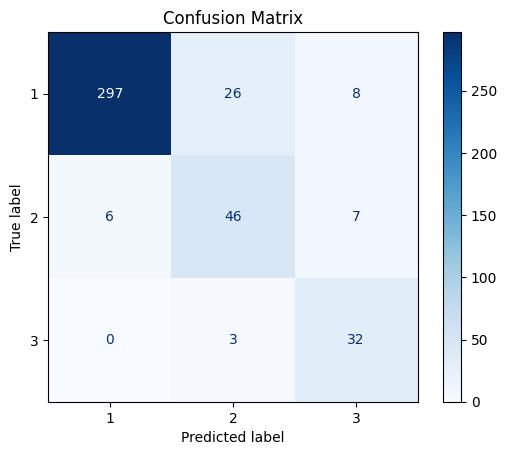

In [26]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=log_reg.classes_)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

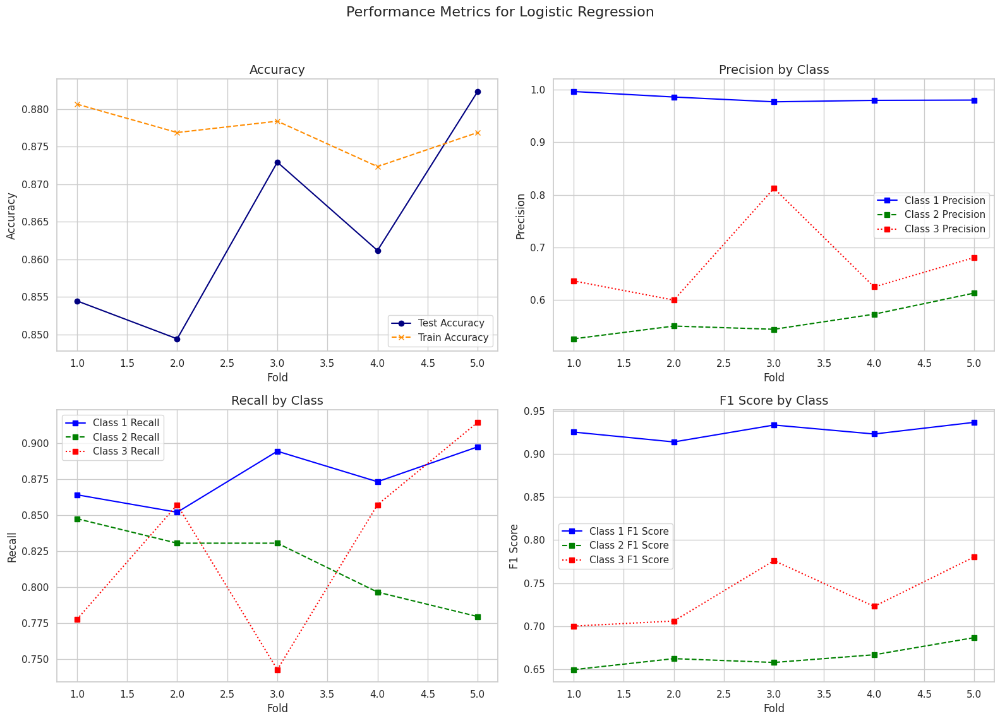

In [27]:
sns.set(style='whitegrid')

# Plotting the results
fig, ax = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Performance Metrics for Logistic Regression', fontsize=16)

colors = ['blue', 'green', 'red']  # Colors for classes 1, 2, and 3
linestyles = ['-', '--', ':']  # Different linestyles for clarity

# Accuracy plot
ax[0, 0].plot(range(1, n_splits + 1), accuracies, label='Test Accuracy', color='navy', marker='o')
ax[0, 0].plot(range(1, n_splits + 1), train_accuracies, label='Train Accuracy', linestyle='--', color='darkorange', marker='x')
ax[0, 0].set_title('Accuracy', fontsize=14)
ax[0, 0].set_xlabel('Fold', fontsize=12)
ax[0, 0].set_ylabel('Accuracy', fontsize=12)
ax[0, 0].legend()

# Precision, Recall, F1-Score by Class
metrics = [(precisions, 'Precision'), (recalls, 'Recall'), (f1_scores, 'F1 Score')]
for idx, (metric, name) in enumerate(metrics, start=1):
    x_idx = idx // 2
    y_idx = idx % 2
    for class_id, color, linestyle in zip([1, 2, 3], colors, linestyles):
        ax[x_idx, y_idx].plot(range(1, n_splits + 1), metric[class_id], label=f'Class {class_id} {name}',
                              color=color, linestyle=linestyle, marker='s')
    ax[x_idx, y_idx].set_title(f'{name} by Class', fontsize=14)
    ax[x_idx, y_idx].set_xlabel('Fold', fontsize=12)
    ax[x_idx, y_idx].set_ylabel(name, fontsize=12)
    ax[x_idx, y_idx].legend()

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

### SVM Linear Kernel

In [28]:
# Assuming you have your features in X and labels in y as numpy arrays

# Define the number of splits for cross-validation
n_splits = 10
# Initialize Stratified KFold
skf = StratifiedKFold(n_splits=n_splits, shuffle = True, random_state=42)


# Initialize SMOTE
smote = SMOTE()

# Initialize StandardScaler
scaler = StandardScaler()

X_ = X.values
y_np = y.values
y_ = y_np.astype(int)

# Initialize lists to store metrics
accuracies = []
precisions = {1: [], 2: [], 3: []}
recalls = {1: [], 2: [], 3: []}
f1_scores = {1: [], 2: [], 3: []}

train_accuracies = []
train_precisions = {1: [], 2: [], 3: []}
train_recalls = {1: [], 2: [], 3: []}
train_f1_scores = {1: [], 2: [], 3: []}

# Perform cross-validation
for train_index, test_index in skf.split(X_, y_):
    X_train, X_test = X_[train_index], X_[test_index]
    y_train, y_test = y_[train_index], y_[test_index]

    # Apply StandardScaler
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Apply SMOTE only on training data
    X_train_resampled, y_train_resampled = smote.fit_resample(X_train_scaled, y_train)

    svm = SVC(kernel="linear")

# Train your classifier
    svm.fit(X_train_resampled, y_train_resampled)

    y_pred = svm.predict(X_test_scaled)
    y_pred_train = svm.predict(X_train_resampled)

    # Calculate accuracy
    accuracy = accuracy_score(y_test, y_pred)
    accuracy_train = accuracy_score(y_train_resampled, y_pred_train)
    accuracies.append(accuracy)
    train_accuracies.append(accuracy_train)

    # Calculate precision, recall, and F1 score for each class
    precision, recall, f1_score, _ = precision_recall_fscore_support(y_test, y_pred, labels=[1, 2, 3])
    for i in range(1, 4):
        precisions[i].append(precision[i-1])
        recalls[i].append(recall[i-1])
        f1_scores[i].append(f1_score[i-1])

    # Calculate precision, recall, and F1 score for each class
    precision, recall, f1_score, _ = precision_recall_fscore_support(y_train_resampled, y_pred_train, labels=[1, 2, 3])
    for i in range(1, 4):
        train_precisions[i].append(precision[i-1])
        train_recalls[i].append(recall[i-1])
        train_f1_scores[i].append(f1_score[i-1])


# Calculate and print the average metrics for each class
avg_accuracy = np.mean(accuracies)
train_avg_accuracy = np.mean(train_accuracies)
print("Average Accuracy:", avg_accuracy)
models.append('SVM Linear Kernel')
train_models.append('SVM Linear Kernel')
for i in range(1, 4):
    avg_precision = np.mean(precisions[i])
    avg_recall = np.mean(recalls[i])
    avg_f1_score = np.mean(f1_scores[i])

    train_avg_precision = np.mean(train_precisions[i])
    train_avg_recall = np.mean(train_recalls[i])
    train_avg_f1_score = np.mean(train_f1_scores[i])

    print(f"\nMetrics for Class {i}:")
    print("Average Precision:", avg_precision)
    print("Average Recall:", avg_recall)
    print("Average F1 Score:", avg_f1_score)
    model_precision[i].append(avg_precision)
    model_recall[i].append(avg_recall)
    model_f1_score[i].append(avg_f1_score)
    train_model_precision[i].append(train_avg_precision)
    train_model_recall[i].append(train_avg_recall)
    train_model_f1_score[i].append(train_avg_f1_score)

Average Accuracy: 0.8720745858800601

Metrics for Class 1:
Average Precision: 0.9833910760886873
Average Recall: 0.8809017889740781
Average F1 Score: 0.9288878815721947

Metrics for Class 2:
Average Precision: 0.5865961722858348
Average Recall: 0.8370114942528735
Average F1 Score: 0.6864719636198676

Metrics for Class 3:
Average Precision: 0.7023228000070105
Average Recall: 0.8470588235294118
Average F1 Score: 0.7634017230208461


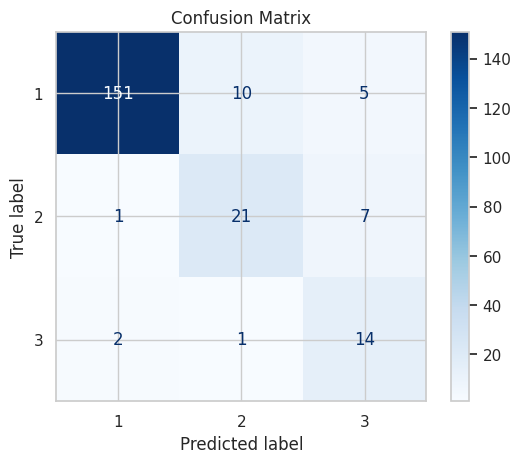

In [29]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=svm.classes_)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

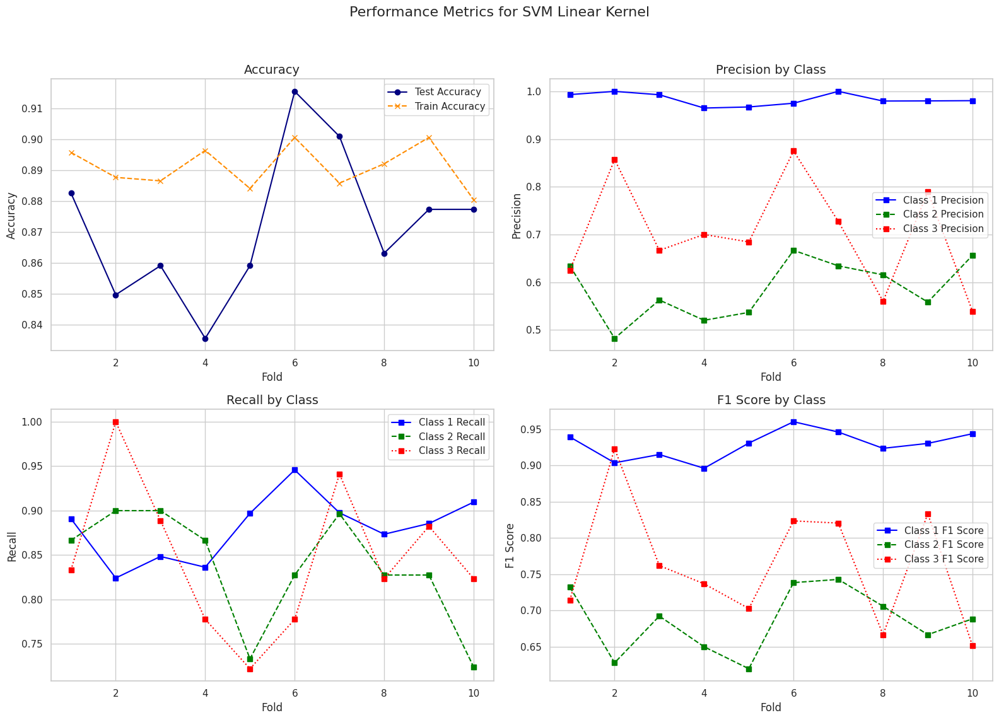

In [30]:
sns.set(style='whitegrid')

# Plotting the results
fig, ax = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Performance Metrics for SVM Linear Kernel', fontsize=16)

colors = ['blue', 'green', 'red']  # Colors for classes 1, 2, and 3
linestyles = ['-', '--', ':']  # Different linestyles for clarity

# Accuracy plot
ax[0, 0].plot(range(1, n_splits + 1), accuracies, label='Test Accuracy', color='navy', marker='o')
ax[0, 0].plot(range(1, n_splits + 1), train_accuracies, label='Train Accuracy', linestyle='--', color='darkorange', marker='x')
ax[0, 0].set_title('Accuracy', fontsize=14)
ax[0, 0].set_xlabel('Fold', fontsize=12)
ax[0, 0].set_ylabel('Accuracy', fontsize=12)
ax[0, 0].legend()

# Precision, Recall, F1-Score by Class
metrics = [(precisions, 'Precision'), (recalls, 'Recall'), (f1_scores, 'F1 Score')]
for idx, (metric, name) in enumerate(metrics, start=1):
    x_idx = idx // 2
    y_idx = idx % 2
    for class_id, color, linestyle in zip([1, 2, 3], colors, linestyles):
        ax[x_idx, y_idx].plot(range(1, n_splits + 1), metric[class_id], label=f'Class {class_id} {name}',
                              color=color, linestyle=linestyle, marker='s')
    ax[x_idx, y_idx].set_title(f'{name} by Class', fontsize=14)
    ax[x_idx, y_idx].set_xlabel('Fold', fontsize=12)
    ax[x_idx, y_idx].set_ylabel(name, fontsize=12)
    ax[x_idx, y_idx].legend()

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

### SVM RBF kernel

In [31]:
# Assuming you have your features in X and labels in y as numpy arrays

# Define the number of splits for cross-validation
n_splits = 10
# Initialize Stratified KFold
skf = StratifiedKFold(n_splits=n_splits, shuffle = True, random_state=42)


# Initialize SMOTE
smote = SMOTE()

# Initialize StandardScaler
scaler = StandardScaler()

X_ = X.values
y_np = y.values
y_ = y_np.astype(int)

# Initialize lists to store metrics
accuracies = []
precisions = {1: [], 2: [], 3: []}
recalls = {1: [], 2: [], 3: []}
f1_scores = {1: [], 2: [], 3: []}

train_accuracies = []
train_precisions = {1: [], 2: [], 3: []}
train_recalls = {1: [], 2: [], 3: []}
train_f1_scores = {1: [], 2: [], 3: []}

# Perform cross-validation
for train_index, test_index in skf.split(X_, y_):
    X_train, X_test = X_[train_index], X_[test_index]
    y_train, y_test = y_[train_index], y_[test_index]

    # Apply StandardScaler
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Apply SMOTE only on training data
    X_train_resampled, y_train_resampled = smote.fit_resample(X_train_scaled, y_train)

    svm = SVC(kernel="rbf")

# Train your classifier
    svm.fit(X_train_resampled, y_train_resampled)

    y_pred = svm.predict(X_test_scaled)
    y_pred_train = svm.predict(X_train_resampled)

    # Calculate accuracy
    accuracy = accuracy_score(y_test, y_pred)
    accuracy_train = accuracy_score(y_train_resampled, y_pred_train)
    accuracies.append(accuracy)
    train_accuracies.append(accuracy_train)

    # Calculate precision, recall, and F1 score for each class
    precision, recall, f1_score, _ = precision_recall_fscore_support(y_test, y_pred, labels=[1, 2, 3])
    for i in range(1, 4):
        precisions[i].append(precision[i-1])
        recalls[i].append(recall[i-1])
        f1_scores[i].append(f1_score[i-1])

    # Calculate precision, recall, and F1 score for each class
    precision, recall, f1_score, _ = precision_recall_fscore_support(y_train_resampled, y_pred_train, labels=[1, 2, 3])
    for i in range(1, 4):
        train_precisions[i].append(precision[i-1])
        train_recalls[i].append(recall[i-1])
        train_f1_scores[i].append(f1_score[i-1])


# Calculate and print the average metrics for each class
avg_accuracy = np.mean(accuracies)
train_avg_accuracy = np.mean(train_accuracies)
print("Average Accuracy:", avg_accuracy)
models.append('SVM RBF Kernel')
train_models.append('SVM RBF Kernel')
for i in range(1, 4):
    avg_precision = np.mean(precisions[i])
    avg_recall = np.mean(recalls[i])
    avg_f1_score = np.mean(f1_scores[i])

    train_avg_precision = np.mean(train_precisions[i])
    train_avg_recall = np.mean(train_recalls[i])
    train_avg_f1_score = np.mean(train_f1_scores[i])

    print(f"\nMetrics for Class {i}:")
    print("Average Precision:", avg_precision)
    print("Average Recall:", avg_recall)
    print("Average F1 Score:", avg_f1_score)
    model_precision[i].append(avg_precision)
    model_recall[i].append(avg_recall)
    model_f1_score[i].append(avg_f1_score)
    train_model_precision[i].append(train_avg_precision)
    train_model_recall[i].append(train_avg_recall)
    train_model_f1_score[i].append(train_avg_f1_score)

Average Accuracy: 0.8890291434139428

Metrics for Class 1:
Average Precision: 0.9841805155939667
Average Recall: 0.8923840817816723
Average F1 Score: 0.9356471124758359

Metrics for Class 2:
Average Precision: 0.592809122094039
Average Recall: 0.8747126436781609
Average F1 Score: 0.7048949040776099

Metrics for Class 3:
Average Precision: 0.8459629465821414
Average Recall: 0.8823529411764707
Average F1 Score: 0.8605132851185484


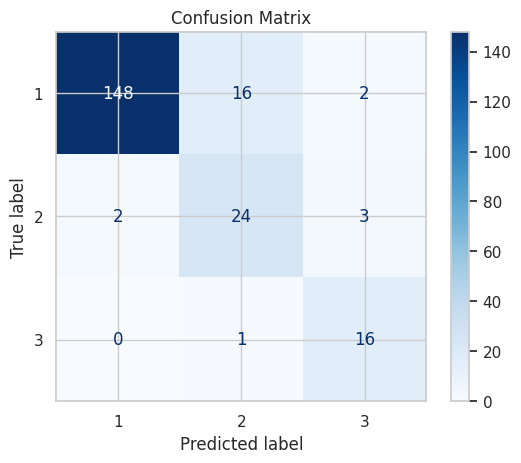

In [32]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=svm.classes_)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

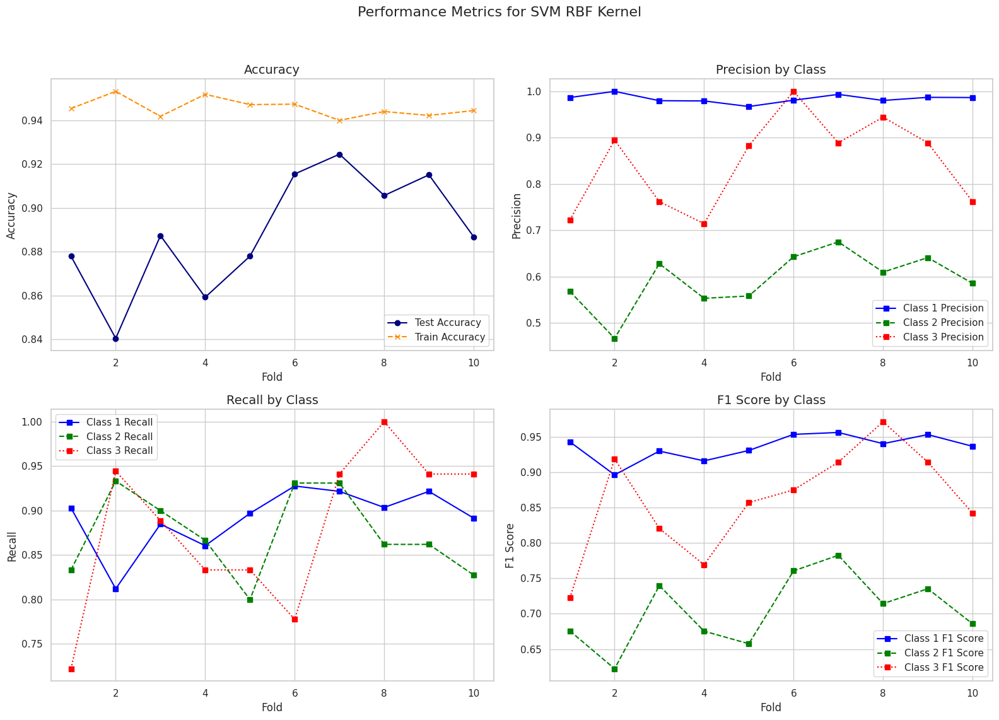

In [33]:
sns.set(style='whitegrid')

# Plotting the results
fig, ax = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Performance Metrics for SVM RBF Kernel', fontsize=16)

colors = ['blue', 'green', 'red']  # Colors for classes 1, 2, and 3
linestyles = ['-', '--', ':']  # Different linestyles for clarity

# Accuracy plot
ax[0, 0].plot(range(1, n_splits + 1), accuracies, label='Test Accuracy', color='navy', marker='o')
ax[0, 0].plot(range(1, n_splits + 1), train_accuracies, label='Train Accuracy', linestyle='--', color='darkorange', marker='x')
ax[0, 0].set_title('Accuracy', fontsize=14)
ax[0, 0].set_xlabel('Fold', fontsize=12)
ax[0, 0].set_ylabel('Accuracy', fontsize=12)
ax[0, 0].legend()

# Precision, Recall, F1-Score by Class
metrics = [(precisions, 'Precision'), (recalls, 'Recall'), (f1_scores, 'F1 Score')]
for idx, (metric, name) in enumerate(metrics, start=1):
    x_idx = idx // 2
    y_idx = idx % 2
    for class_id, color, linestyle in zip([1, 2, 3], colors, linestyles):
        ax[x_idx, y_idx].plot(range(1, n_splits + 1), metric[class_id], label=f'Class {class_id} {name}',
                              color=color, linestyle=linestyle, marker='s')
    ax[x_idx, y_idx].set_title(f'{name} by Class', fontsize=14)
    ax[x_idx, y_idx].set_xlabel('Fold', fontsize=12)
    ax[x_idx, y_idx].set_ylabel(name, fontsize=12)
    ax[x_idx, y_idx].legend()

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

### KNN

In [34]:
# Assuming you have your features in X and labels in y as numpy arrays

# Define the number of splits for cross-validation
n_splits = 10
# Initialize Stratified KFold
skf = StratifiedKFold(n_splits=n_splits, shuffle = True, random_state=42)


# Initialize SMOTE
smote = SMOTE()

# Initialize StandardScaler
scaler = StandardScaler()

X_ = X.values
y_np = y.values
y_ = y_np.astype(int)

# Initialize lists to store metrics
accuracies = []
precisions = {1: [], 2: [], 3: []}
recalls = {1: [], 2: [], 3: []}
f1_scores = {1: [], 2: [], 3: []}

train_accuracies = []
train_precisions = {1: [], 2: [], 3: []}
train_recalls = {1: [], 2: [], 3: []}
train_f1_scores = {1: [], 2: [], 3: []}

# Perform cross-validation
for train_index, test_index in skf.split(X_, y_):
    X_train, X_test = X_[train_index], X_[test_index]
    y_train, y_test = y_[train_index], y_[test_index]

    # Apply StandardScaler
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Apply SMOTE only on training data
    X_train_resampled, y_train_resampled = smote.fit_resample(X_train_scaled, y_train)

    knn = KNeighborsClassifier(n_neighbors=5)  # You can adjust the number of neighbors as needed

# Train your classifier
    knn.fit(X_train_resampled, y_train_resampled)

    y_pred = knn.predict(X_test_scaled)
    y_pred_train = knn.predict(X_train_resampled)

    # Calculate accuracy
    accuracy = accuracy_score(y_test, y_pred)
    accuracy_train = accuracy_score(y_train_resampled, y_pred_train)
    accuracies.append(accuracy)
    train_accuracies.append(accuracy_train)

    # Calculate precision, recall, and F1 score for each class
    precision, recall, f1_score, _ = precision_recall_fscore_support(y_test, y_pred, labels=[1, 2, 3])
    for i in range(1, 4):
        precisions[i].append(precision[i-1])
        recalls[i].append(recall[i-1])
        f1_scores[i].append(f1_score[i-1])

    # Calculate precision, recall, and F1 score for each class
    precision, recall, f1_score, _ = precision_recall_fscore_support(y_train_resampled, y_pred_train, labels=[1, 2, 3])
    for i in range(1, 4):
        train_precisions[i].append(precision[i-1])
        train_recalls[i].append(recall[i-1])
        train_f1_scores[i].append(f1_score[i-1])


# Calculate and print the average metrics for each class
avg_accuracy = np.mean(accuracies)
train_avg_accuracy = np.mean(train_accuracies)
print("Average Accuracy:", avg_accuracy)
models.append('KNN')
train_models.append('KNN')
for i in range(1, 4):
    avg_precision = np.mean(precisions[i])
    avg_recall = np.mean(recalls[i])
    avg_f1_score = np.mean(f1_scores[i])

    train_avg_precision = np.mean(train_precisions[i])
    train_avg_recall = np.mean(train_recalls[i])
    train_avg_f1_score = np.mean(train_f1_scores[i])

    print(f"\nMetrics for Class {i}:")
    print("Average Precision:", avg_precision)
    print("Average Recall:", avg_recall)
    print("Average F1 Score:", avg_f1_score)
    model_precision[i].append(avg_precision)
    model_recall[i].append(avg_recall)
    model_f1_score[i].append(avg_f1_score)
    train_model_precision[i].append(train_avg_precision)
    train_model_recall[i].append(train_avg_recall)
    train_model_f1_score[i].append(train_avg_f1_score)

Average Accuracy: 0.8908871467800514

Metrics for Class 1:
Average Precision: 0.9768733350762584
Average Recall: 0.9002555677254472
Average F1 Score: 0.9365912146597102

Metrics for Class 2:
Average Precision: 0.6085475817036635
Average Recall: 0.8332183908045977
Average F1 Score: 0.699957732224283

Metrics for Class 3:
Average Precision: 0.8332228989994167
Average Recall: 0.8980392156862745
Average F1 Score: 0.861588188548847


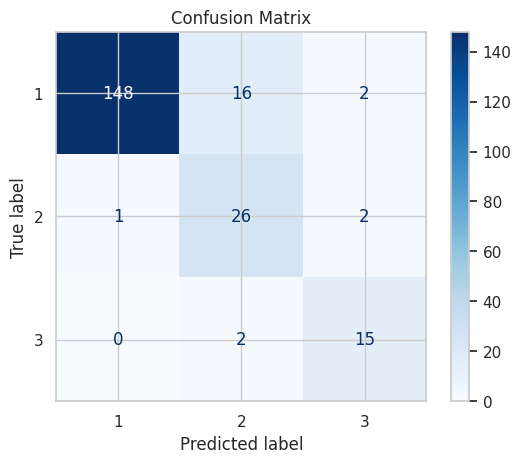

In [35]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=knn.classes_)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

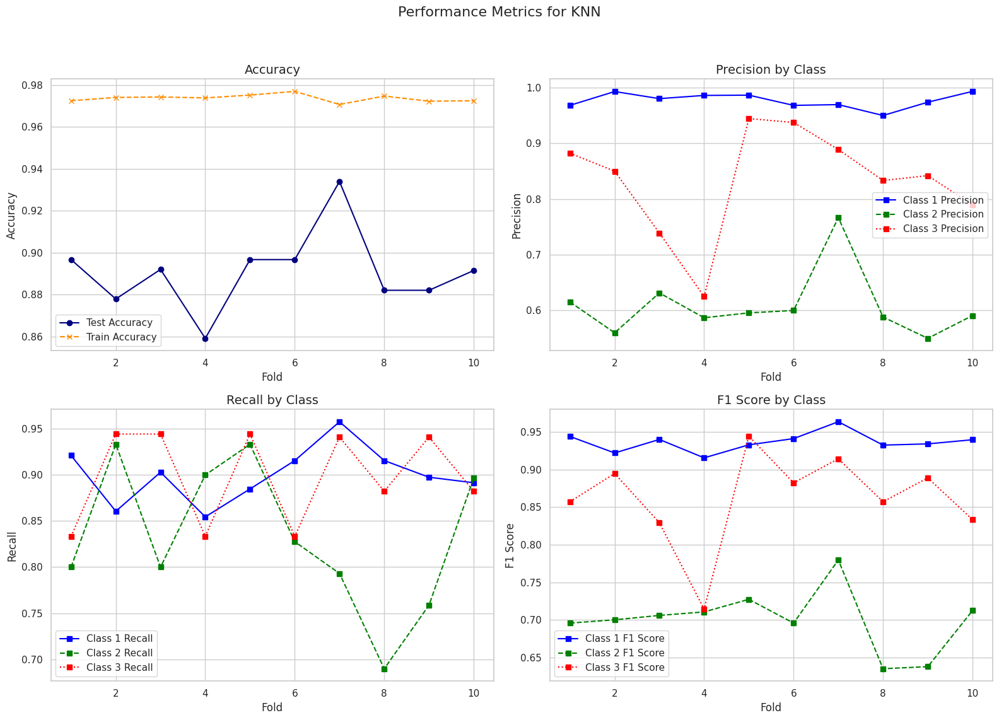

In [36]:
sns.set(style='whitegrid')

# Plotting the results
fig, ax = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Performance Metrics for KNN', fontsize=16)

colors = ['blue', 'green', 'red']  # Colors for classes 1, 2, and 3
linestyles = ['-', '--', ':']  # Different linestyles for clarity

# Accuracy plot
ax[0, 0].plot(range(1, n_splits + 1), accuracies, label='Test Accuracy', color='navy', marker='o')
ax[0, 0].plot(range(1, n_splits + 1), train_accuracies, label='Train Accuracy', linestyle='--', color='darkorange', marker='x')
ax[0, 0].set_title('Accuracy', fontsize=14)
ax[0, 0].set_xlabel('Fold', fontsize=12)
ax[0, 0].set_ylabel('Accuracy', fontsize=12)
ax[0, 0].legend()

# Precision, Recall, F1-Score by Class
metrics = [(precisions, 'Precision'), (recalls, 'Recall'), (f1_scores, 'F1 Score')]
for idx, (metric, name) in enumerate(metrics, start=1):
    x_idx = idx // 2
    y_idx = idx % 2
    for class_id, color, linestyle in zip([1, 2, 3], colors, linestyles):
        ax[x_idx, y_idx].plot(range(1, n_splits + 1), metric[class_id], label=f'Class {class_id} {name}',
                              color=color, linestyle=linestyle, marker='s')
    ax[x_idx, y_idx].set_title(f'{name} by Class', fontsize=14)
    ax[x_idx, y_idx].set_xlabel('Fold', fontsize=12)
    ax[x_idx, y_idx].set_ylabel(name, fontsize=12)
    ax[x_idx, y_idx].legend()

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

### Decision Tree

In [37]:
# Assuming you have your features in X and labels in y as numpy arrays

# Define the number of splits for cross-validation
n_splits = 10
# Initialize Stratified KFold
skf = StratifiedKFold(n_splits=n_splits, shuffle = True, random_state=42)


# Initialize SMOTE
smote = SMOTE()

# Initialize StandardScaler
scaler = StandardScaler()

X_ = X.values
y_np = y.values
y_ = y_np.astype(int)

# Initialize lists to store metrics
accuracies = []
precisions = {1: [], 2: [], 3: []}
recalls = {1: [], 2: [], 3: []}
f1_scores = {1: [], 2: [], 3: []}

train_accuracies = []
train_precisions = {1: [], 2: [], 3: []}
train_recalls = {1: [], 2: [], 3: []}
train_f1_scores = {1: [], 2: [], 3: []}

# Perform cross-validation
for train_index, test_index in skf.split(X_, y_):
    X_train, X_test = X_[train_index], X_[test_index]
    y_train, y_test = y_[train_index], y_[test_index]

    # Apply StandardScaler
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Apply SMOTE only on training data
    X_train_resampled, y_train_resampled = smote.fit_resample(X_train_scaled, y_train)

    decision_tree = DecisionTreeClassifier()

# Train your classifier
    decision_tree.fit(X_train_resampled, y_train_resampled)

    y_pred = decision_tree.predict(X_test_scaled)
    y_pred_train = decision_tree.predict(X_train_resampled)

    # Calculate accuracy
    accuracy = accuracy_score(y_test, y_pred)
    accuracy_train = accuracy_score(y_train_resampled, y_pred_train)
    accuracies.append(accuracy)
    train_accuracies.append(accuracy_train)

    # Calculate precision, recall, and F1 score for each class
    precision, recall, f1_score, _ = precision_recall_fscore_support(y_test, y_pred, labels=[1, 2, 3])
    for i in range(1, 4):
        precisions[i].append(precision[i-1])
        recalls[i].append(recall[i-1])
        f1_scores[i].append(f1_score[i-1])

    # Calculate precision, recall, and F1 score for each class
    precision, recall, f1_score, _ = precision_recall_fscore_support(y_train_resampled, y_pred_train, labels=[1, 2, 3])
    for i in range(1, 4):
        train_precisions[i].append(precision[i-1])
        train_recalls[i].append(recall[i-1])
        train_f1_scores[i].append(f1_score[i-1])


# Calculate and print the average metrics for each class
avg_accuracy = np.mean(accuracies)
train_avg_accuracy = np.mean(train_accuracies)
print("Average Accuracy:", avg_accuracy)
models.append('Decision Tree')
train_models.append('Decision Tree')
for i in range(1, 4):
    avg_precision = np.mean(precisions[i])
    avg_recall = np.mean(recalls[i])
    avg_f1_score = np.mean(f1_scores[i])

    train_avg_precision = np.mean(train_precisions[i])
    train_avg_recall = np.mean(train_recalls[i])
    train_avg_f1_score = np.mean(train_f1_scores[i])

    print(f"\nMetrics for Class {i}:")
    print("Average Precision:", avg_precision)
    print("Average Recall:", avg_recall)
    print("Average F1 Score:", avg_f1_score)
    model_precision[i].append(avg_precision)
    model_recall[i].append(avg_recall)
    model_f1_score[i].append(avg_f1_score)
    train_model_precision[i].append(train_avg_precision)
    train_model_recall[i].append(train_avg_recall)
    train_model_f1_score[i].append(train_avg_f1_score)

Average Accuracy: 0.9209961024005671

Metrics for Class 1:
Average Precision: 0.9578631915147986
Average Recall: 0.9467981014968967
Average F1 Score: 0.9522638044337762

Metrics for Class 2:
Average Precision: 0.7511410285117182
Average Recall: 0.793448275862069
Average F1 Score: 0.7711423138649824

Metrics for Class 3:
Average Precision: 0.8881320949432403
Average Recall: 0.892483660130719
Average F1 Score: 0.8868421211155656


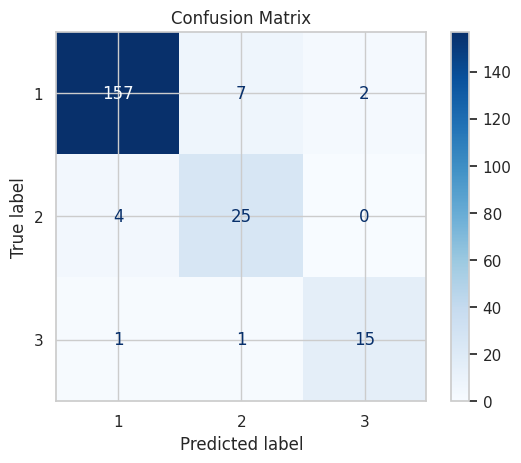

In [38]:
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=decision_tree.classes_)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

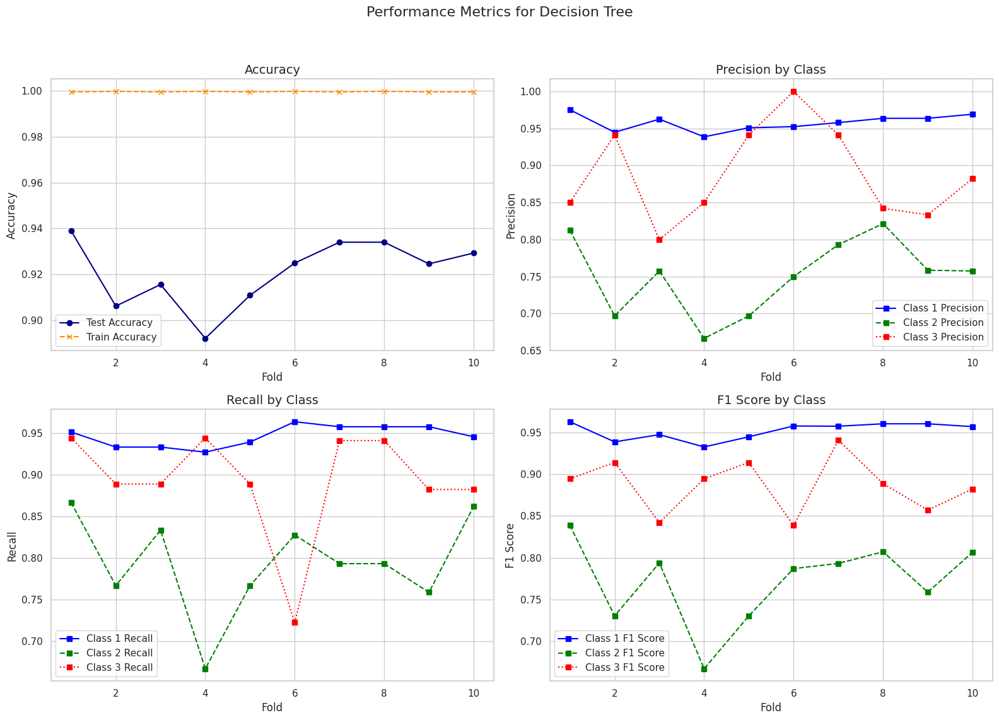

In [39]:
sns.set(style='whitegrid')

# Plotting the results
fig, ax = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Performance Metrics for Decision Tree', fontsize=16)

colors = ['blue', 'green', 'red']  # Colors for classes 1, 2, and 3
linestyles = ['-', '--', ':']  # Different linestyles for clarity

# Accuracy plot
ax[0, 0].plot(range(1, n_splits + 1), accuracies, label='Test Accuracy', color='navy', marker='o')
ax[0, 0].plot(range(1, n_splits + 1), train_accuracies, label='Train Accuracy', linestyle='--', color='darkorange', marker='x')
ax[0, 0].set_title('Accuracy', fontsize=14)
ax[0, 0].set_xlabel('Fold', fontsize=12)
ax[0, 0].set_ylabel('Accuracy', fontsize=12)
ax[0, 0].legend()

# Precision, Recall, F1-Score by Class
metrics = [(precisions, 'Precision'), (recalls, 'Recall'), (f1_scores, 'F1 Score')]
for idx, (metric, name) in enumerate(metrics, start=1):
    x_idx = idx // 2
    y_idx = idx % 2
    for class_id, color, linestyle in zip([1, 2, 3], colors, linestyles):
        ax[x_idx, y_idx].plot(range(1, n_splits + 1), metric[class_id], label=f'Class {class_id} {name}',
                              color=color, linestyle=linestyle, marker='s')
    ax[x_idx, y_idx].set_title(f'{name} by Class', fontsize=14)
    ax[x_idx, y_idx].set_xlabel('Fold', fontsize=12)
    ax[x_idx, y_idx].set_ylabel(name, fontsize=12)
    ax[x_idx, y_idx].legend()

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

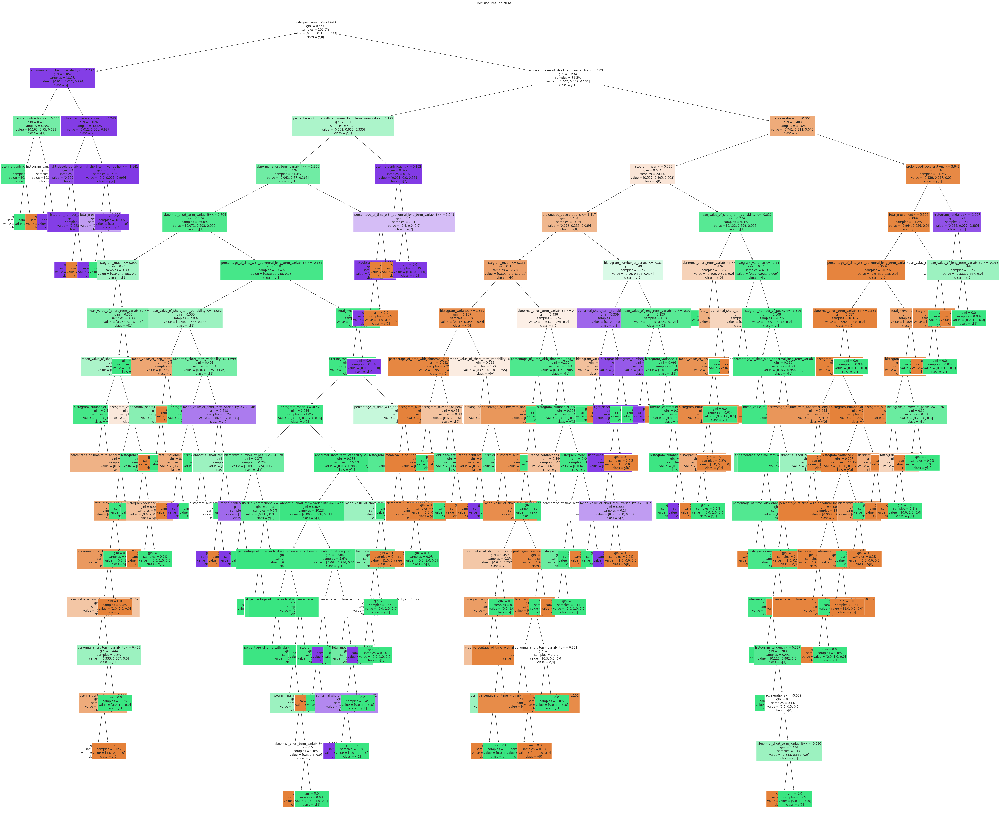

In [40]:
from sklearn import tree

plt.figure(figsize=(70,60))
tree.plot_tree(decision_tree, filled=True, feature_names=X.columns, class_names=True, proportion=True, fontsize=12)
plt.title('Decision Tree Structure')
plt.show()

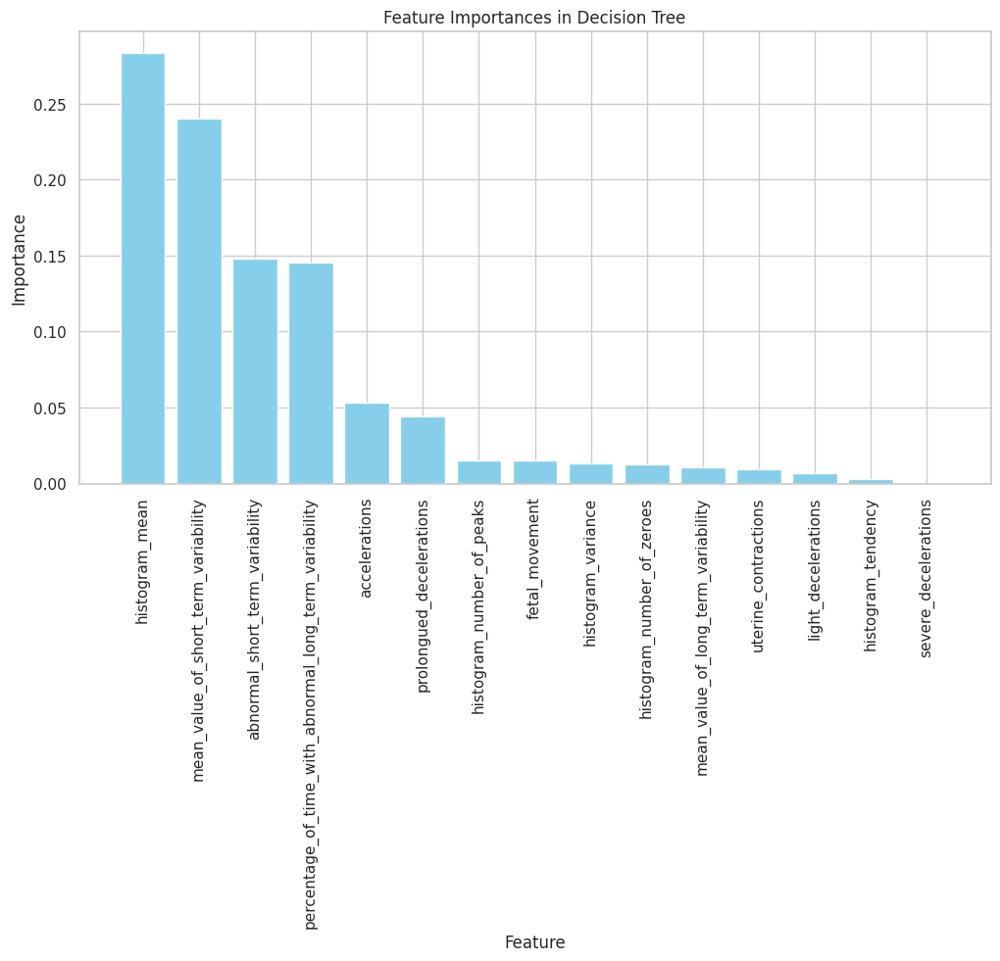

In [41]:
feature_importances = decision_tree.feature_importances_

# Sort the feature importances in descending order and make a plot
indices = np.argsort(feature_importances)[::-1]

# Visualizing the feature importances
plt.figure(figsize=(12, 6))
plt.title('Feature Importances in Decision Tree')
plt.bar(range(len(feature_importances)), feature_importances[indices], align='center', color='skyblue')
plt.xticks(range(len(feature_importances)), [X.columns[i] for i in indices], rotation=90)
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.show()

### Random Forest

In [42]:
# Assuming you have your features in X and labels in y as numpy arrays

# Define the number of splits for cross-validation
n_splits = 10
# Initialize Stratified KFold
skf = StratifiedKFold(n_splits=n_splits, shuffle = True, random_state=42)


# Initialize SMOTE
smote = SMOTE()

# Initialize StandardScaler
scaler = StandardScaler()

X_ = X.values
y_np = y.values
y_ = y_np.astype(int)

# Initialize lists to store metrics
accuracies = []
precisions = {1: [], 2: [], 3: []}
recalls = {1: [], 2: [], 3: []}
f1_scores = {1: [], 2: [], 3: []}

train_accuracies = []
train_precisions = {1: [], 2: [], 3: []}
train_recalls = {1: [], 2: [], 3: []}
train_f1_scores = {1: [], 2: [], 3: []}

# Perform cross-validation
for train_index, test_index in skf.split(X_, y_):
    X_train, X_test = X_[train_index], X_[test_index]
    y_train, y_test = y_[train_index], y_[test_index]

    # Apply StandardScaler
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Apply SMOTE only on training data
    X_train_resampled, y_train_resampled = smote.fit_resample(X_train_scaled, y_train)

    random_forest = RandomForestClassifier()

# Train your classifier
    random_forest.fit(X_train_resampled, y_train_resampled)

    y_pred = random_forest.predict(X_test_scaled)
    y_pred_train = random_forest.predict(X_train_resampled)

    # Calculate accuracy
    accuracy = accuracy_score(y_test, y_pred)
    accuracy_train = accuracy_score(y_train_resampled, y_pred_train)
    accuracies.append(accuracy)
    train_accuracies.append(accuracy_train)

    # Calculate precision, recall, and F1 score for each class
    precision, recall, f1_score, _ = precision_recall_fscore_support(y_test, y_pred, labels=[1, 2, 3])
    for i in range(1, 4):
        precisions[i].append(precision[i-1])
        recalls[i].append(recall[i-1])
        f1_scores[i].append(f1_score[i-1])

    # Calculate precision, recall, and F1 score for each class
    precision, recall, f1_score, _ = precision_recall_fscore_support(y_train_resampled, y_pred_train, labels=[1, 2, 3])
    for i in range(1, 4):
        train_precisions[i].append(precision[i-1])
        train_recalls[i].append(recall[i-1])
        train_f1_scores[i].append(f1_score[i-1])


# Calculate and print the average metrics for each class
avg_accuracy = np.mean(accuracies)
train_avg_accuracy = np.mean(train_accuracies)
print("Average Accuracy:", avg_accuracy)
models.append('Random Forest')
train_models.append('Random Forest')
for i in range(1, 4):
    avg_precision = np.mean(precisions[i])
    avg_recall = np.mean(recalls[i])
    avg_f1_score = np.mean(f1_scores[i])

    train_avg_precision = np.mean(train_precisions[i])
    train_avg_recall = np.mean(train_recalls[i])
    train_avg_f1_score = np.mean(train_f1_scores[i])

    print(f"\nMetrics for Class {i}:")
    print("Average Precision:", avg_precision)
    print("Average Recall:", avg_recall)
    print("Average F1 Score:", avg_f1_score)
    model_precision[i].append(avg_precision)
    model_recall[i].append(avg_recall)
    model_f1_score[i].append(avg_f1_score)
    train_model_precision[i].append(train_avg_precision)
    train_model_recall[i].append(train_avg_recall)
    train_model_f1_score[i].append(train_avg_f1_score)

Average Accuracy: 0.9416865975728583

Metrics for Class 1:
Average Precision: 0.9673499948789107
Average Recall: 0.9655348667396859
Average F1 Score: 0.9664002833685794

Metrics for Class 2:
Average Precision: 0.8119176960117874
Average Recall: 0.8105747126436782
Average F1 Score: 0.8102741951313115

Metrics for Class 3:
Average Precision: 0.9287593984962406
Average Recall: 0.9375816993464052
Average F1 Score: 0.930662464900081


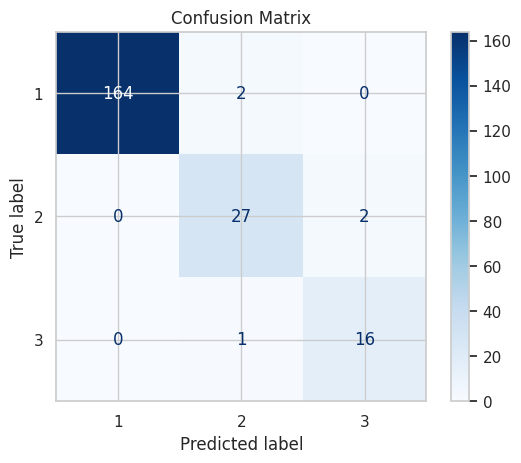

In [43]:
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=random_forest.classes_)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

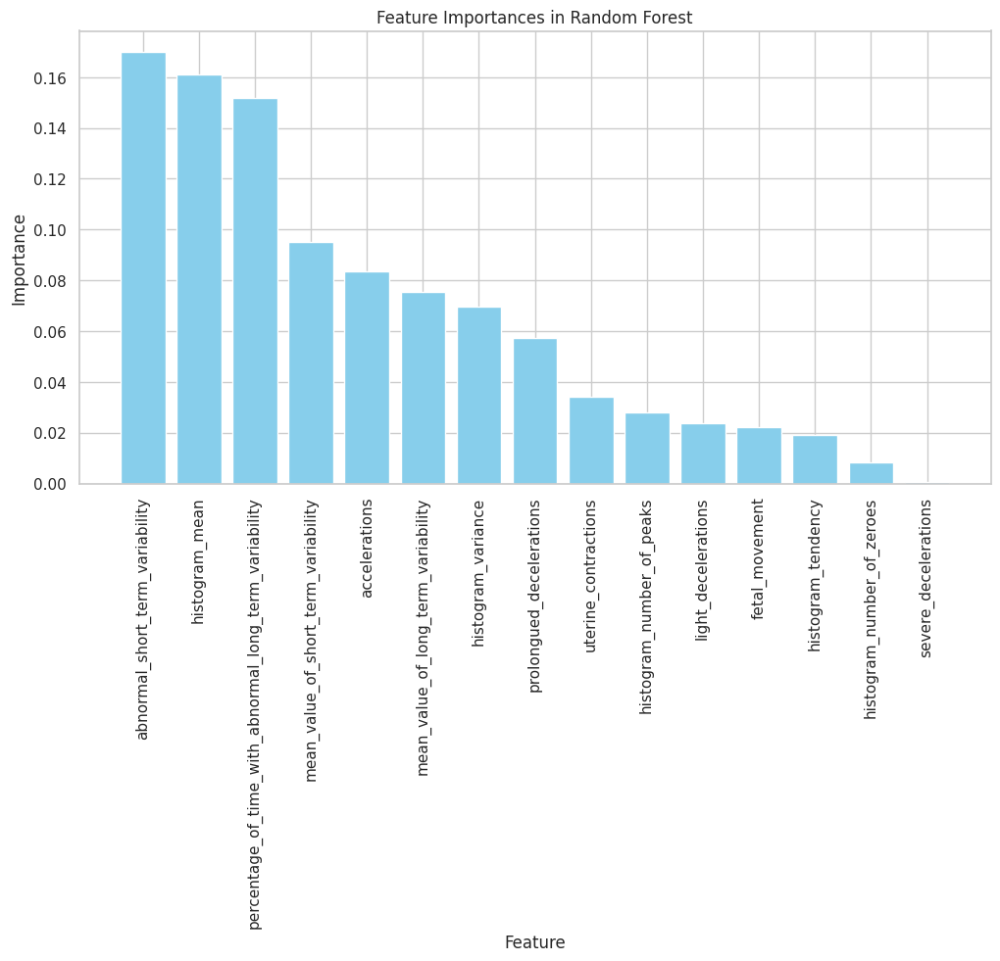

In [44]:
feature_importances = random_forest.feature_importances_

# Sort the feature importances in descending order and make a plot
indices = np.argsort(feature_importances)[::-1]

# Visualizing the feature importances
plt.figure(figsize=(12, 6))
plt.title('Feature Importances in Random Forest')
plt.bar(range(len(feature_importances)), feature_importances[indices], align='center', color='skyblue')
plt.xticks(range(len(feature_importances)), [X.columns[i] for i in indices], rotation=90)
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.show()

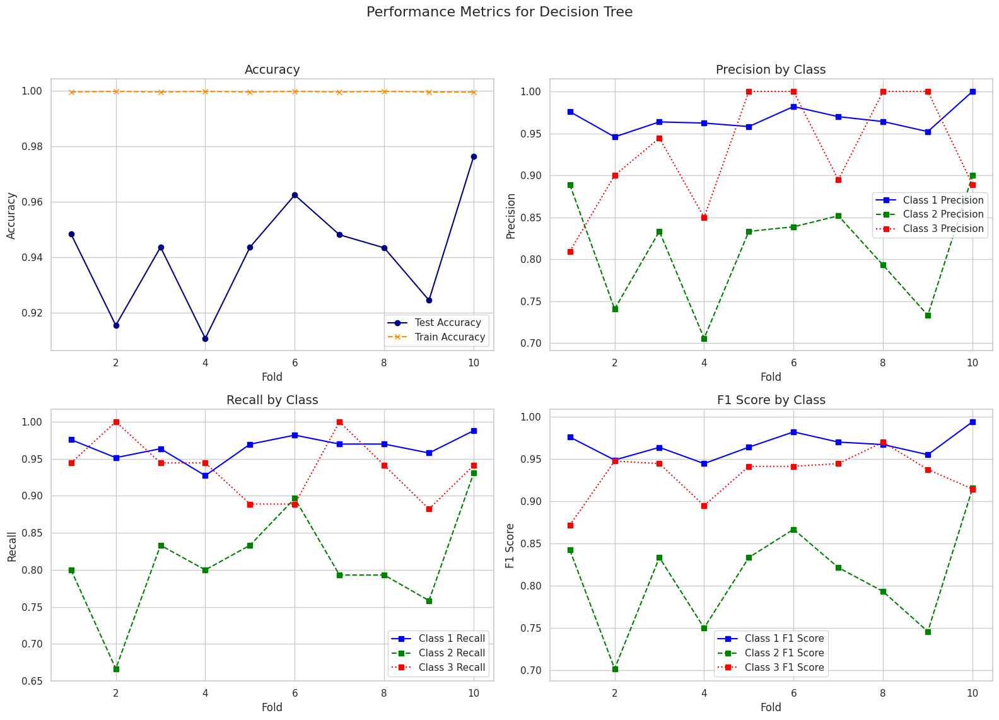

In [45]:
sns.set(style='whitegrid')

# Plotting the results
fig, ax = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Performance Metrics for Decision Tree', fontsize=16)

colors = ['blue', 'green', 'red']  # Colors for classes 1, 2, and 3
linestyles = ['-', '--', ':']  # Different linestyles for clarity

# Accuracy plot
ax[0, 0].plot(range(1, n_splits + 1), accuracies, label='Test Accuracy', color='navy', marker='o')
ax[0, 0].plot(range(1, n_splits + 1), train_accuracies, label='Train Accuracy', linestyle='--', color='darkorange', marker='x')
ax[0, 0].set_title('Accuracy', fontsize=14)
ax[0, 0].set_xlabel('Fold', fontsize=12)
ax[0, 0].set_ylabel('Accuracy', fontsize=12)
ax[0, 0].legend()

# Precision, Recall, F1-Score by Class
metrics = [(precisions, 'Precision'), (recalls, 'Recall'), (f1_scores, 'F1 Score')]
for idx, (metric, name) in enumerate(metrics, start=1):
    x_idx = idx // 2
    y_idx = idx % 2
    for class_id, color, linestyle in zip([1, 2, 3], colors, linestyles):
        ax[x_idx, y_idx].plot(range(1, n_splits + 1), metric[class_id], label=f'Class {class_id} {name}',
                              color=color, linestyle=linestyle, marker='s')
    ax[x_idx, y_idx].set_title(f'{name} by Class', fontsize=14)
    ax[x_idx, y_idx].set_xlabel('Fold', fontsize=12)
    ax[x_idx, y_idx].set_ylabel(name, fontsize=12)
    ax[x_idx, y_idx].legend()

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

### Ada Boost Classifier

In [46]:
# Assuming you have your features in X and labels in y as numpy arrays

# Define the number of splits for cross-validation
n_splits = 10
# Initialize Stratified KFold
skf = StratifiedKFold(n_splits=n_splits, shuffle = True, random_state=42)


# Initialize SMOTE
smote = SMOTE()

# Initialize StandardScaler
scaler = StandardScaler()

X_ = X.values
y_np = y.values
y_ = y_np.astype(int)

# Initialize lists to store metrics
accuracies = []
precisions = {1: [], 2: [], 3: []}
recalls = {1: [], 2: [], 3: []}
f1_scores = {1: [], 2: [], 3: []}

train_accuracies = []
train_precisions = {1: [], 2: [], 3: []}
train_recalls = {1: [], 2: [], 3: []}
train_f1_scores = {1: [], 2: [], 3: []}

# Perform cross-validation
for train_index, test_index in skf.split(X_, y_):
    X_train, X_test = X_[train_index], X_[test_index]
    y_train, y_test = y_[train_index], y_[test_index]

    # Apply StandardScaler
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Apply SMOTE only on training data
    X_train_resampled, y_train_resampled = smote.fit_resample(X_train_scaled, y_train)

    adaboost = AdaBoostClassifier()

# Train your classifier
    adaboost.fit(X_train_resampled, y_train_resampled)

    y_pred = adaboost.predict(X_test_scaled)
    y_pred_train = adaboost.predict(X_train_resampled)

    # Calculate accuracy
    accuracy = accuracy_score(y_test, y_pred)
    accuracy_train = accuracy_score(y_train_resampled, y_pred_train)
    accuracies.append(accuracy)
    train_accuracies.append(accuracy_train)

    # Calculate precision, recall, and F1 score for each class
    precision, recall, f1_score, _ = precision_recall_fscore_support(y_test, y_pred, labels=[1, 2, 3])
    for i in range(1, 4):
        precisions[i].append(precision[i-1])
        recalls[i].append(recall[i-1])
        f1_scores[i].append(f1_score[i-1])

    # Calculate precision, recall, and F1 score for each class
    precision, recall, f1_score, _ = precision_recall_fscore_support(y_train_resampled, y_pred_train, labels=[1, 2, 3])
    for i in range(1, 4):
        train_precisions[i].append(precision[i-1])
        train_recalls[i].append(recall[i-1])
        train_f1_scores[i].append(f1_score[i-1])


# Calculate and print the average metrics for each class
avg_accuracy = np.mean(accuracies)
train_avg_accuracy = np.mean(train_accuracies)
print("Average Accuracy:", avg_accuracy)
models.append('AdaBoost')
train_models.append('AdaBoost')
for i in range(1, 4):
    avg_precision = np.mean(precisions[i])
    avg_recall = np.mean(recalls[i])
    avg_f1_score = np.mean(f1_scores[i])

    train_avg_precision = np.mean(train_precisions[i])
    train_avg_recall = np.mean(train_recalls[i])
    train_avg_f1_score = np.mean(train_f1_scores[i])

    print(f"\nMetrics for Class {i}:")
    print("Average Precision:", avg_precision)
    print("Average Recall:", avg_recall)
    print("Average F1 Score:", avg_f1_score)
    model_precision[i].append(avg_precision)
    model_recall[i].append(avg_recall)
    model_f1_score[i].append(avg_f1_score)
    train_model_precision[i].append(train_avg_precision)
    train_model_recall[i].append(train_avg_recall)
    train_model_f1_score[i].append(train_avg_f1_score)

Average Accuracy: 0.8762733634511471

Metrics for Class 1:
Average Precision: 0.9536901377394471
Average Recall: 0.8918473895582331
Average F1 Score: 0.9215486303589241

Metrics for Class 2:
Average Precision: 0.5782823162162188
Average Recall: 0.7759770114942529
Average F1 Score: 0.6603167869925416

Metrics for Class 3:
Average Precision: 0.8940135990600387
Average Recall: 0.8977124183006536
Average F1 Score: 0.8921429799990171


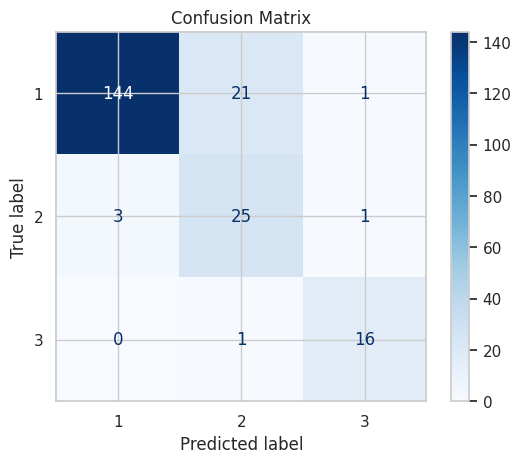

In [47]:
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=adaboost.classes_)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

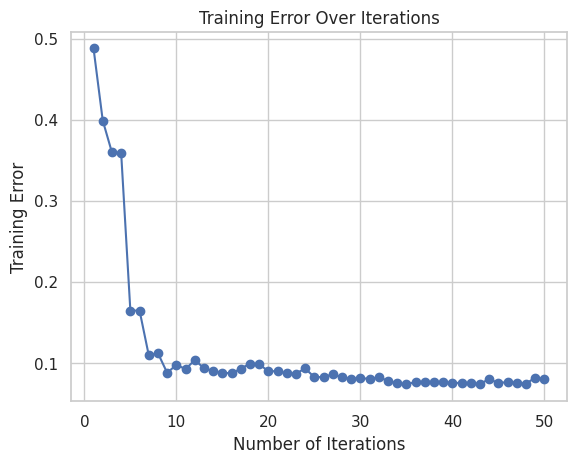

In [48]:
# Error Rate of Each Boosting Iteration:

ada_errors = [1 - accuracy for accuracy in adaboost.staged_score(X_train_resampled, y_train_resampled)]
plt.figure()
plt.plot(range(1, len(ada_errors) + 1), ada_errors, marker='o')
plt.xlabel('Number of Iterations')
plt.ylabel('Training Error')
plt.title('Training Error Over Iterations')
plt.show()

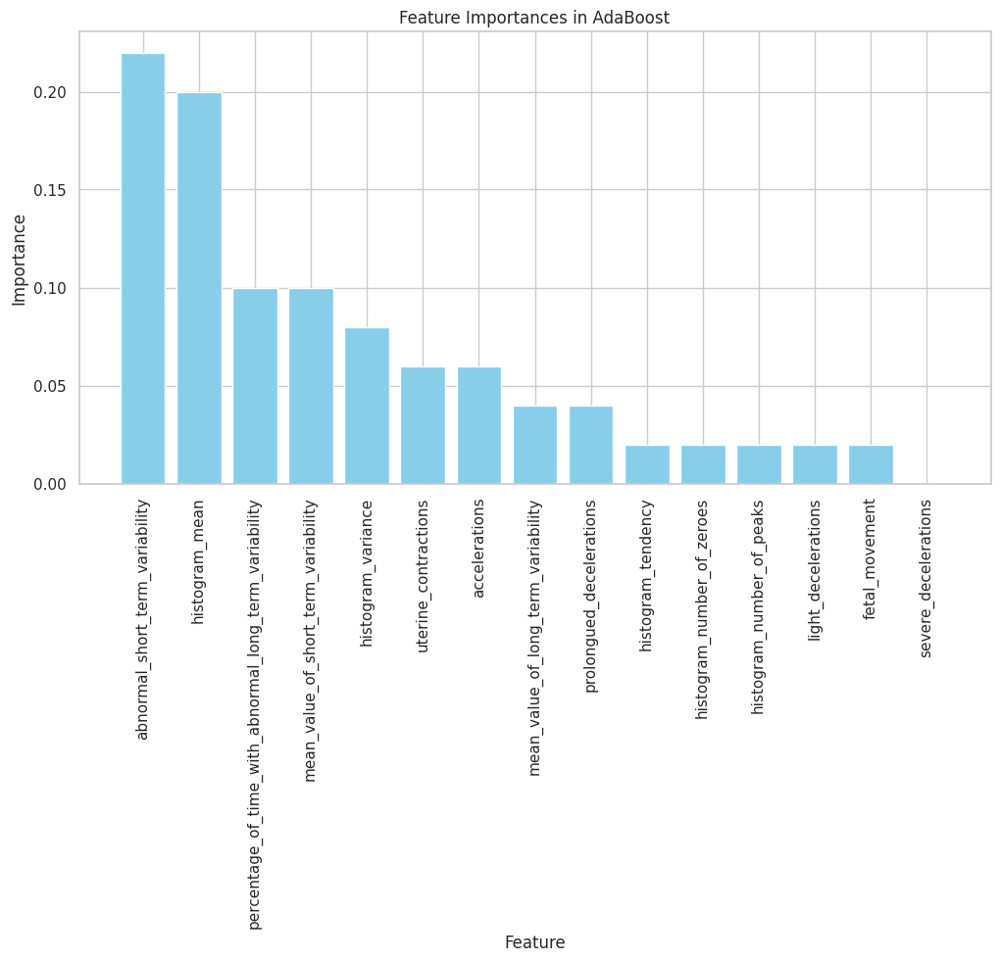

In [49]:
feature_importances = adaboost.feature_importances_

# Sort the feature importances in descending order and make a plot
indices = np.argsort(feature_importances)[::-1]

# Visualizing the feature importances
plt.figure(figsize=(12, 6))
plt.title('Feature Importances in AdaBoost')
plt.bar(range(len(feature_importances)), feature_importances[indices], align='center', color='skyblue')
plt.xticks(range(len(feature_importances)), [X.columns[i] for i in indices], rotation=90)
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.show()

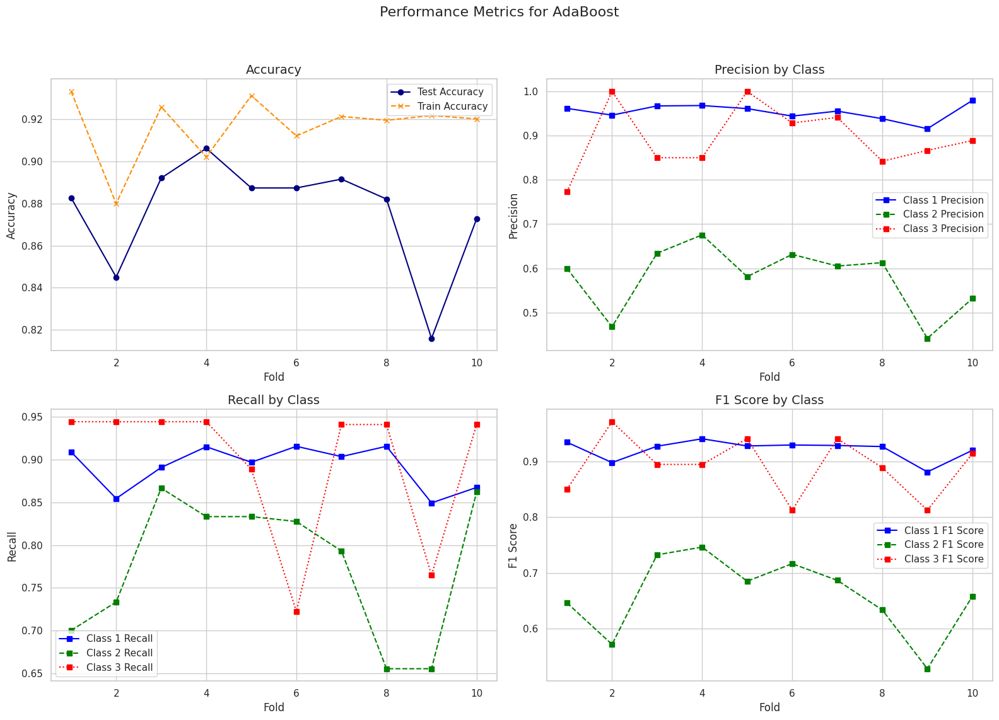

In [50]:
sns.set(style='whitegrid')

# Plotting the results
fig, ax = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Performance Metrics for AdaBoost', fontsize=16)

colors = ['blue', 'green', 'red']  # Colors for classes 1, 2, and 3
linestyles = ['-', '--', ':']  # Different linestyles for clarity

# Accuracy plot
ax[0, 0].plot(range(1, n_splits + 1), accuracies, label='Test Accuracy', color='navy', marker='o')
ax[0, 0].plot(range(1, n_splits + 1), train_accuracies, label='Train Accuracy', linestyle='--', color='darkorange', marker='x')
ax[0, 0].set_title('Accuracy', fontsize=14)
ax[0, 0].set_xlabel('Fold', fontsize=12)
ax[0, 0].set_ylabel('Accuracy', fontsize=12)
ax[0, 0].legend()

# Precision, Recall, F1-Score by Class
metrics = [(precisions, 'Precision'), (recalls, 'Recall'), (f1_scores, 'F1 Score')]
for idx, (metric, name) in enumerate(metrics, start=1):
    x_idx = idx // 2
    y_idx = idx % 2
    for class_id, color, linestyle in zip([1, 2, 3], colors, linestyles):
        ax[x_idx, y_idx].plot(range(1, n_splits + 1), metric[class_id], label=f'Class {class_id} {name}',
                              color=color, linestyle=linestyle, marker='s')
    ax[x_idx, y_idx].set_title(f'{name} by Class', fontsize=14)
    ax[x_idx, y_idx].set_xlabel('Fold', fontsize=12)
    ax[x_idx, y_idx].set_ylabel(name, fontsize=12)
    ax[x_idx, y_idx].legend()

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

### XG Boost Classifier

In [51]:
# Assuming you have your features in X and labels in y as numpy arrays

# Define the number of splits for cross-validation
n_splits = 10
# Initialize Stratified KFold
skf = StratifiedKFold(n_splits=n_splits, shuffle = True, random_state=42)


# Initialize SMOTE
smote = SMOTE()

# Initialize StandardScaler
scaler = StandardScaler()

X_ = X.values
y_np = y.values
y_ = y_np.astype(int)

y_-=1

# Initialize lists to store metrics
accuracies = []
precisions = {1: [], 2: [], 3: []}
recalls = {1: [], 2: [], 3: []}
f1_scores = {1: [], 2: [], 3: []}

train_accuracies = []
train_precisions = {1: [], 2: [], 3: []}
train_recalls = {1: [], 2: [], 3: []}
train_f1_scores = {1: [], 2: [], 3: []}

# Perform cross-validation
for train_index, test_index in skf.split(X_, y_):
    X_train, X_test = X_[train_index], X_[test_index]
    y_train, y_test = y_[train_index], y_[test_index]

    # Apply StandardScaler
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Apply SMOTE only on training data
    X_train_resampled, y_train_resampled = smote.fit_resample(X_train_scaled, y_train)

    xgboost = xgb.XGBClassifier()

# Train your classifier
    xgboost.fit(X_train_resampled, y_train_resampled)

    y_pred = xgboost.predict(X_test_scaled)
    y_pred_train = xgboost.predict(X_train_resampled)

    # Calculate accuracy
    accuracy = accuracy_score(y_test, y_pred)
    accuracy_train = accuracy_score(y_train_resampled, y_pred_train)
    accuracies.append(accuracy)
    train_accuracies.append(accuracy_train)

    # Calculate precision, recall, and F1 score for each class
    precision, recall, f1_score, _ = precision_recall_fscore_support(y_test, y_pred, labels=[0, 1, 2])
    for i in range(1, 4):
        precisions[i].append(precision[i-1])
        recalls[i].append(recall[i-1])
        f1_scores[i].append(f1_score[i-1])

    # Calculate precision, recall, and F1 score for each class
    precision, recall, f1_score, _ = precision_recall_fscore_support(y_train_resampled, y_pred_train, labels=[0, 1, 2])
    for i in range(1, 4):
        train_precisions[i].append(precision[i-1])
        train_recalls[i].append(recall[i-1])
        train_f1_scores[i].append(f1_score[i-1])


# Calculate and print the average metrics for each class
avg_accuracy = np.mean(accuracies)
train_avg_accuracy = np.mean(train_accuracies)
print("Average Accuracy:", avg_accuracy)
models.append('XGBoost')
train_models.append('XGBoost')
for i in range(1, 4):
    avg_precision = np.mean(precisions[i])
    avg_recall = np.mean(recalls[i])
    avg_f1_score = np.mean(f1_scores[i])

    train_avg_precision = np.mean(train_precisions[i])
    train_avg_recall = np.mean(train_recalls[i])
    train_avg_f1_score = np.mean(train_f1_scores[i])

    print(f"\nMetrics for Class {i}:")
    print("Average Precision:", avg_precision)
    print("Average Recall:", avg_recall)
    print("Average F1 Score:", avg_f1_score)
    model_precision[i].append(avg_precision)
    model_recall[i].append(avg_recall)
    model_f1_score[i].append(avg_f1_score)
    train_model_precision[i].append(train_avg_precision)
    train_model_recall[i].append(train_avg_recall)
    train_model_f1_score[i].append(train_avg_f1_score)

Average Accuracy: 0.9515457525024358

Metrics for Class 1:
Average Precision: 0.9711338039226657
Average Recall: 0.9740124132895218
Average F1 Score: 0.9725316506925539

Metrics for Class 2:
Average Precision: 0.8526403234634603
Average Recall: 0.8340229885057472
Average F1 Score: 0.8426780706064727

Metrics for Class 3:
Average Precision: 0.934312005503956
Average Recall: 0.9372549019607843
Average F1 Score: 0.9349731714747195


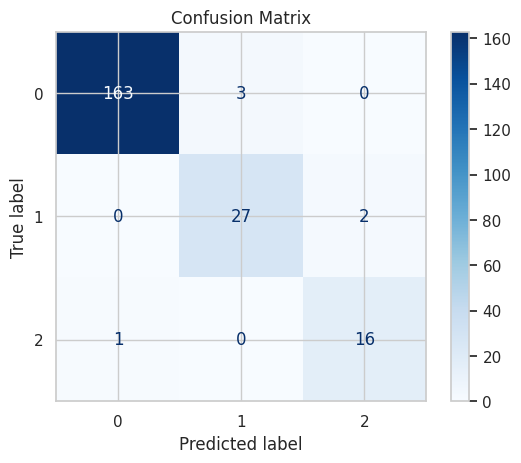

In [52]:
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=xgboost.classes_)
disp.plot(cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.show()

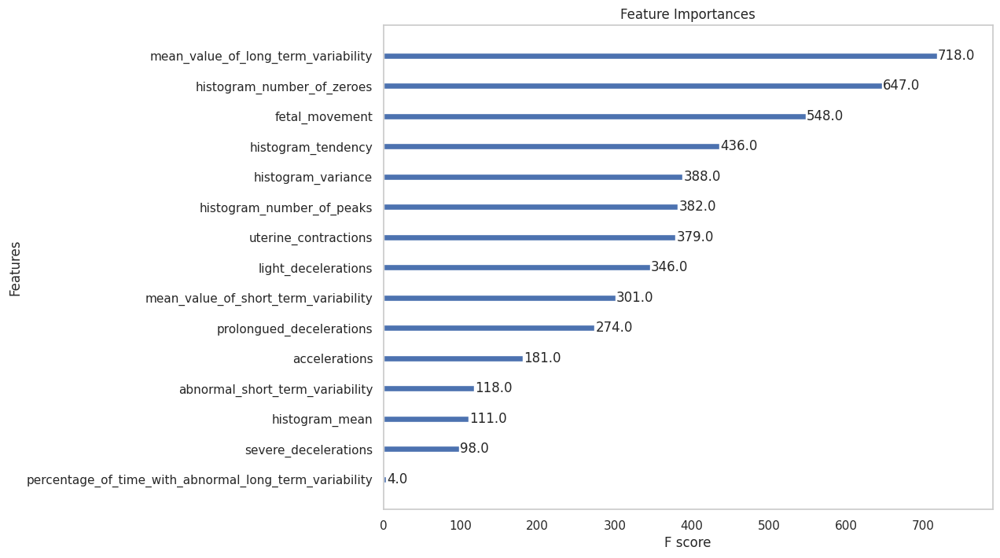

In [53]:
fig, ax = plt.subplots(figsize=(10, 8))  # Adjust the figure size as needed
xgb.plot_importance(xgboost, ax=ax, importance_type='weight', show_values=True,
                    title='Feature Importances', xlabel='F score', ylabel='Features',
                    grid=False)  # Adjust grid, xlabel, ylabel as per your need
# You may need to set the feature names if they are not automatically picked up:
ax.set_yticklabels([X.columns[i] for i in xgboost.feature_importances_.argsort()[::-1]])
plt.show()

In [54]:
plt.figure(figsize=(40, 40), dpi=300)
xgb.plot_tree(xgboost, num_trees=0, rankdir='LR', ax=plt.gca())
plt.rcParams.update({'font.size': 16})
plt.title('XGBoost Tree', fontsize=16)
plt.show()

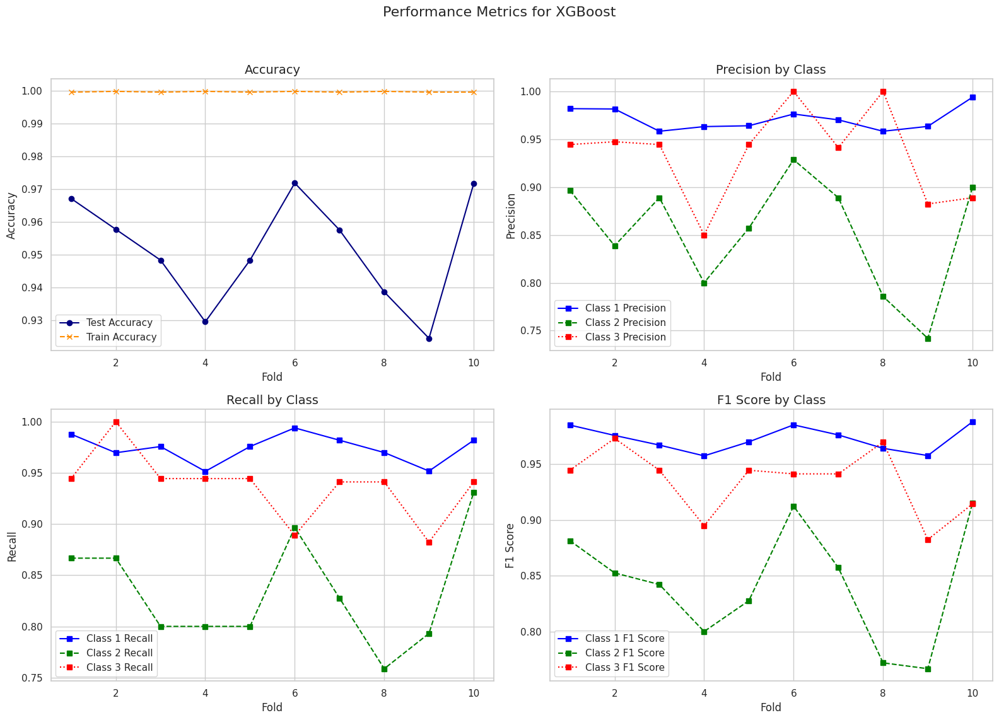

In [55]:
sns.set(style='whitegrid')

# Plotting the results
fig, ax = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Performance Metrics for XGBoost', fontsize=16)

colors = ['blue', 'green', 'red']  # Colors for classes 1, 2, and 3
linestyles = ['-', '--', ':']  # Different linestyles for clarity

# Accuracy plot
ax[0, 0].plot(range(1, n_splits + 1), accuracies, label='Test Accuracy', color='navy', marker='o')
ax[0, 0].plot(range(1, n_splits + 1), train_accuracies, label='Train Accuracy', linestyle='--', color='darkorange', marker='x')
ax[0, 0].set_title('Accuracy', fontsize=14)
ax[0, 0].set_xlabel('Fold', fontsize=12)
ax[0, 0].set_ylabel('Accuracy', fontsize=12)
ax[0, 0].legend()

# Precision, Recall, F1-Score by Class
metrics = [(precisions, 'Precision'), (recalls, 'Recall'), (f1_scores, 'F1 Score')]
for idx, (metric, name) in enumerate(metrics, start=1):
    x_idx = idx // 2
    y_idx = idx % 2
    for class_id, color, linestyle in zip([1, 2, 3], colors, linestyles):
        ax[x_idx, y_idx].plot(range(1, n_splits + 1), metric[class_id], label=f'Class {class_id} {name}',
                              color=color, linestyle=linestyle, marker='s')
    ax[x_idx, y_idx].set_title(f'{name} by Class', fontsize=14)
    ax[x_idx, y_idx].set_xlabel('Fold', fontsize=12)
    ax[x_idx, y_idx].set_ylabel(name, fontsize=12)
    ax[x_idx, y_idx].legend()

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [56]:
Results=pd.DataFrame()
Results['Model']=models
Results['Precision N']=model_precision[1]
Results['Precision S']=model_precision[2]
Results['Precision P']=model_precision[3]
Results['Recall N']=model_recall[1]
Results['Recall S']=model_recall[2]
Results['Recall P']=model_recall[3]
Results['F1 Score N']=model_f1_score[1]
Results['F1 Score S']=model_f1_score[2]
Results['F1 Score P']=model_f1_score[3]

In [57]:
# Define new multi-index columns
columns = pd.MultiIndex.from_tuples([
    ('Precision', 'N'),
    ('Precision', 'S'),
    ('Precision', 'P'),
    ('Recall', 'N'),
    ('Recall', 'S'),
    ('Recall', 'P'),
    ('F1 score', 'N'),
    ('F1 score', 'S'),
    ('F1 score', 'P')
])

df = Results.set_index('Model')

df.columns = columns
df_sorted = df.sort_values(by=('Recall', 'P'), ascending=False)
print('Comparison of machine learning models on test data: \n')
df_sorted

Comparison of machine learning models on test data: 



Precision                        Recall            \
                            N         S         P         N         S   
Model                                                                   
Random Forest        0.967350  0.811918  0.928759  0.965535  0.810575   
XGBoost              0.971134  0.852640  0.934312  0.974012  0.834023   
KNN                  0.976873  0.608548  0.833223  0.900256  0.833218   
AdaBoost             0.953690  0.578282  0.894014  0.891847  0.775977   
Decision Tree        0.957863  0.751141  0.888132  0.946798  0.793448   
SVM RBF Kernel       0.984181  0.592809  0.845963  0.892384  0.874713   
SVM Linear Kernel    0.983391  0.586596  0.702323  0.880902  0.837011   
Logistic Regression  0.983857  0.561565  0.670943  0.876133  0.816949   

                               F1 score                      
                            P         N         S         P  
Model                                                        
Random Forest        0.937582  0.966400  0.810274  0.930662  
XGBoost              0.937255  0.972532  0.842678  0.934973  
KNN                  0.898039  0.936591  0.699958  0.861588  
AdaBoost             0.897712  0.921549  0.660317  0.892143  
Decision Tree        0.892484  0.952264  0.771142  0.886842  
SVM RBF Kernel       0.882353  0.935647  0.704895  0.860513  
SVM Linear Kernel    0.847059  0.928888  0.686472  0.763402  
Logistic Regression  0.829841  0.926730  0.664493  0.737076

In [68]:
df_sorted.to_csv('/content/Test_results.csv', header = True, index = True)

In [58]:
train_Results=pd.DataFrame()
train_Results['Model']=train_models
train_Results['Precision N']=train_model_precision[1]
train_Results['Precision S']=train_model_precision[2]
train_Results['Precision P']=train_model_precision[3]
train_Results['Recall N']=train_model_recall[1]
train_Results['Recall S']=train_model_recall[2]
train_Results['Recall P']=train_model_recall[3]
train_Results['F1 Score N']=train_model_f1_score[1]
train_Results['F1 Score S']=train_model_f1_score[2]
train_Results['F1 Score P']=train_model_f1_score[3]

In [59]:
# Define new multi-index columns
columns = pd.MultiIndex.from_tuples([
    ('Precision', 'N'),
    ('Precision', 'S'),
    ('Precision', 'P'),
    ('Recall', 'N'),
    ('Recall', 'S'),
    ('Recall', 'P'),
    ('F1 score', 'N'),
    ('F1 score', 'S'),
    ('F1 score', 'P')
])

df_train = train_Results.set_index('Model')

df_train.columns = columns
df_sorted_train = df_train.sort_values(by=[('Recall', 'P'), ('Recall', 'S')], ascending=False)
print('Comparison of machine learning models on train data: \n')
df_sorted_train

Comparison of machine learning models on train data: 



Precision                        Recall            \
                            N         S         P         N         S   
Model                                                                   
Random Forest        0.999933  0.998994  1.000000  0.998993  0.999933   
XGBoost              0.999597  0.999329  1.000000  0.999329  0.999597   
Decision Tree        0.998927  1.000000  1.000000  1.000000  0.998926   
KNN                  0.998128  0.937787  0.988808  0.931654  0.993421   
SVM RBF Kernel       0.992880  0.886248  0.967954  0.898623  0.965826   
AdaBoost             0.877187  0.892738  0.986519  0.900300  0.898691   
SVM Linear Kernel    0.967113  0.817871  0.902807  0.881638  0.901713   
Logistic Regression  0.950983  0.813167  0.876282  0.881873  0.861782   

                               F1 score                      
                            P         N         S         P  
Model                                                        
Random Forest        1.000000  0.999463  0.999463  1.000000  
XGBoost              1.000000  0.999463  0.999463  1.000000  
Decision Tree        1.000000  0.999463  0.999463  1.000000  
KNN                  0.995972  0.963742  0.964795  0.992374  
SVM RBF Kernel       0.972877  0.943399  0.924317  0.970397  
AdaBoost             0.950860  0.887816  0.895342  0.968096  
SVM Linear Kernel    0.889694  0.922382  0.857689  0.896112  
Logistic Regression  0.887462  0.915122  0.836751  0.881804

In [69]:
df_sorted_train.to_csv('/content/Train_results.csv', header = True, index = True)

In [71]:
df_test = pd.read_csv('/content/Train_results.csv', header=[0, 1], index_col=[0, 1])
df_test

Precision              Recall            \
                                     S         P         N         S   
Model                                                                  
Random Forest       0.999933  0.998994  1.000000  0.998993  0.999933   
XGBoost             0.999597  0.999329  1.000000  0.999329  0.999597   
Decision Tree       0.998927  1.000000  1.000000  1.000000  0.998926   
KNN                 0.998128  0.937787  0.988808  0.931654  0.993421   
SVM RBF Kernel      0.992880  0.886248  0.967954  0.898623  0.965826   
AdaBoost            0.877187  0.892738  0.986519  0.900300  0.898691   
SVM Linear Kernel   0.967113  0.817871  0.902807  0.881638  0.901713   
Logistic Regression 0.950983  0.813167  0.876282  0.881873  0.861782   

                                        F1 score                      
                                     P         N         S         P  
Model                                                                 
Random Forest       0.999933  1.000000  0.999463  0.999463  1.000000  
XGBoost             0.999597  1.000000  0.999463  0.999463  1.000000  
Decision Tree       0.998927  1.000000  0.999463  0.999463  1.000000  
KNN                 0.998128  0.995972  0.963742  0.964795  0.992374  
SVM RBF Kernel      0.992880  0.972877  0.943399  0.924317  0.970397  
AdaBoost            0.877187  0.950860  0.887816  0.895342  0.968096  
SVM Linear Kernel   0.967113  0.889694  0.922382  0.857689  0.896112  
Logistic Regression 0.950983  0.887462  0.915122  0.836751  0.881804